In [1]:
import os
import glob
import random
import multiprocessing
import copy
import pprint
from pathlib import Path
import time
from datetime import datetime
from typing import Optional, Union, Tuple

import enum
import matplotlib.pyplot as plt
from IPython import display
import seaborn as sns
from skimage.util import montage
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from scipy import stats
import nrrd
import torch
import torchio as tio
import torchvision
from torch import nn
import torch.nn.functional as F
from torchvision.ops.focal_loss import sigmoid_focal_loss
from unet import UNet
from torchinfo import summary


seed = 2022

random.seed(seed)
torch.manual_seed(seed)
num_workers = multiprocessing.cpu_count()


path_saved_models = os.path.join(os.getcwd(), '..', 'saved_models')

if not os.path.isdir(path_saved_models):
    os.mkdir(path_saved_models)

In [2]:
class Visualizer:
    
    def montage_nrrd(self, image):
        if len(image.shape) > 2:
            return montage(image)
        else:
            warnings.warn('Pass a 3D volume', RuntimeWarning)
            return image
        
    def visualize(self, image, mask=None):
        
        if mask is None:
            fig, axes = plt.subplots(1, 1, figsize=(10, 10))
            axes.imshow(self.montage_nrrd(image))
            axes.set_axis_off()
        else:
            fig, axes = plt.subplots(1, 2, figsize=(40, 40))
        
            for i, data in enumerate([image, mask]):
                axes[i].imshow(self.montage_nrrd(data))
                axes[i].set_axis_off()
                
                
vis = Visualizer()

In [3]:
path_data = os.path.join(os.getcwd(), '..', 'data')
path_eda = os.path.join(path_data, 'eda')
path_segmentation = os.path.join(path_data, 'segmentation_xyz')
path_cropped = os.path.join(path_data, 'segmentation_xyz_cropped')

In [4]:
df = pd.read_csv(os.path.join(path_eda, 'spect_data.csv'))

df.head()

,image,image_slices,image_height,image_width,mask,mask_slices,mask_height,mask_width,slices_positive,positive_pixels_ratio,positive_ratio,positive_slice_ratio
0,1.nrrd,62,64,64,1_Segmentation.nrrd,62.0,64.0,64.0,11.0,0.002788,0.177419,0.18 %
1,2.nrrd,64,64,64,2_Segmentation.nrrd,64.0,64.0,64.0,9.0,0.001781,0.140625,0.14 %
2,3.nrrd,64,64,64,3_Segmentation.nrrd,64.0,64.0,64.0,12.0,0.006973,0.187500,0.19 %
3,4.nrrd,64,64,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.nrrd,128,128,128,5_Segmentation.nrrd,128.0,128.0,128.0,22.0,0.001923,0.171875,0.17 %


In [5]:
def load_image(path):
    
    data, header = nrrd.read(path)
    data = data.astype(np.float32)
    affine = np.eye(4)
    
    return data, affine

In [6]:
subjects = []

segmentations = list(df.loc[(df['mask'].notnull()), ['image', 'mask']].to_records(index=False))
segmentations = list(map(
    lambda x: (
        os.path.join(path_segmentation, x[0]),
        os.path.join(path_segmentation, x[1])
    ), 
    segmentations
))

for image_path, label_path in segmentations:

    subject = tio.Subject(
        spect=tio.ScalarImage(image_path, reader=load_image),
        left_ventricle=tio.LabelMap(label_path, reader=load_image)
    )
    subjects.append(subject)

dataset = tio.SubjectsDataset(subjects)
print(f"Dataset size: {len(dataset)} subjects")

Dataset size: 10 subjects


In [7]:
for i, sub in enumerate(subjects):
    try:
        assert sub['spect'][tio.DATA].dtype == torch.float32
        assert sub['left_ventricle'][tio.DATA].dtype == torch.float32
    except:
        print(i)

In [9]:
one_subject = dataset[0]

In [10]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 10


training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape, mask_name="left_ventricle"),
    tio.ZNormalization(),
    tio.RandomFlip(axes=(0, 1, 2), p=0.5),
    tio.OneOf({
        tio.RandomAnisotropy(p=0.5),
        tio.RandomBlur(p=0.5),
        tio.RandomNoise(p=0.5),  
    }, p=0.5),
    tio.OneOf({
        tio.RandomAffine(): 0.6,
        tio.RandomElasticDeformation(max_displacement=max_displacement): 0.2,
        tio.RandomElasticDeformation(
            max_displacement=max_displacement,
            num_control_points=num_control_points
        ): 0.2
    }, p=0.8),
    tio.OneHot()
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape, mask_name="left_ventricle"),
    tio.ZNormalization(),
    tio.OneHot()
])

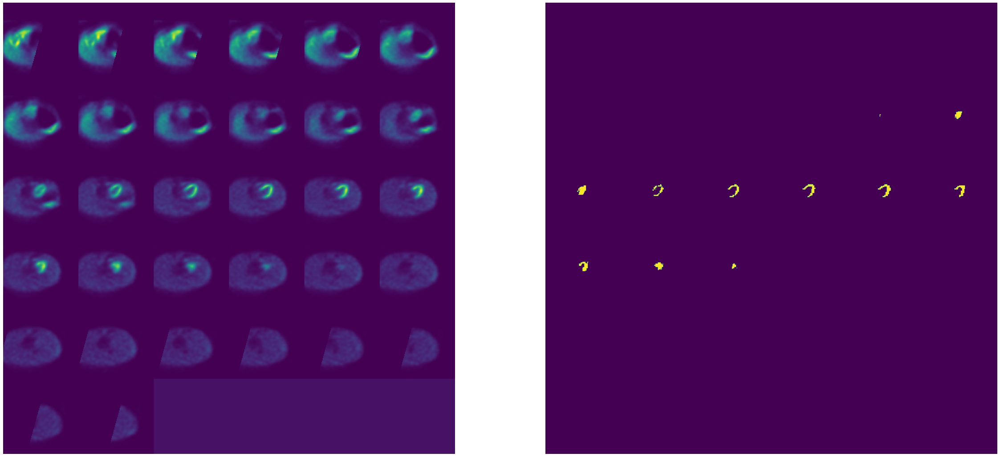

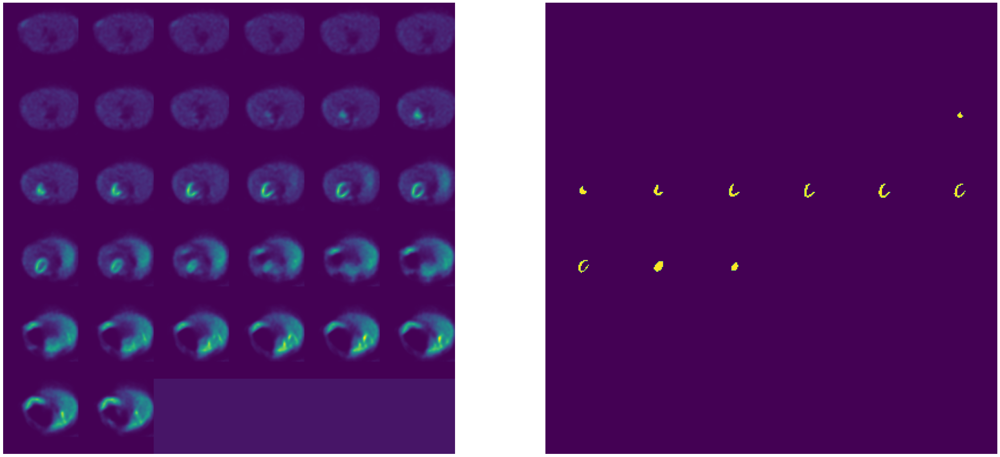

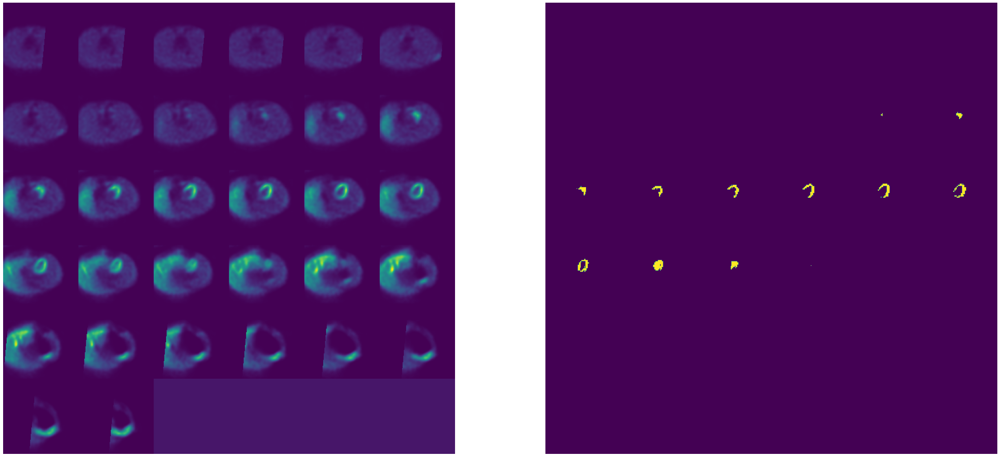

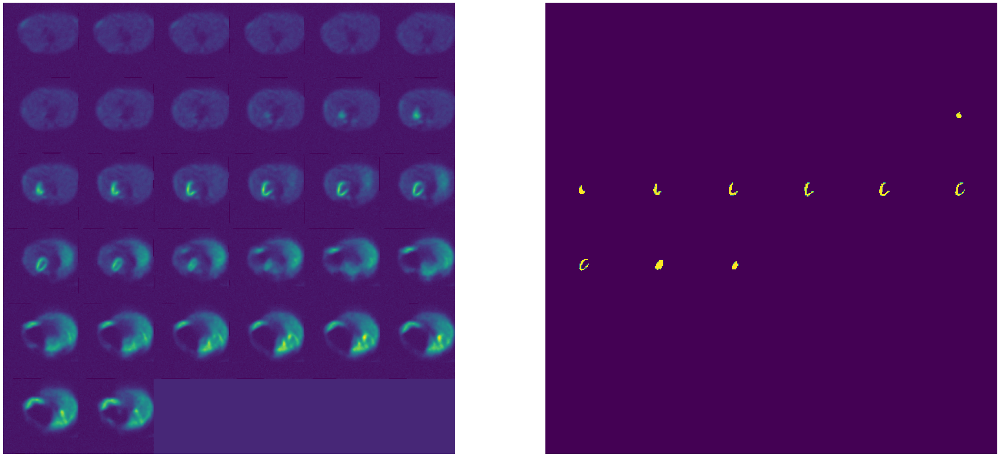

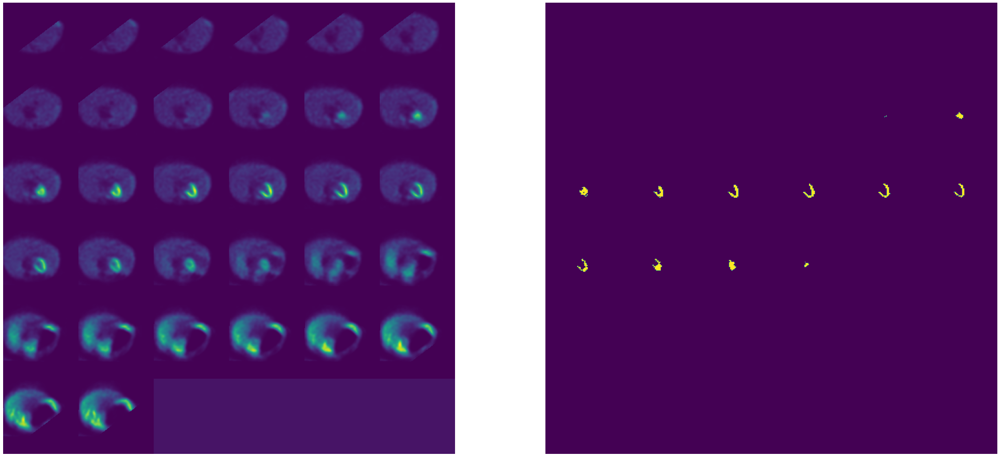

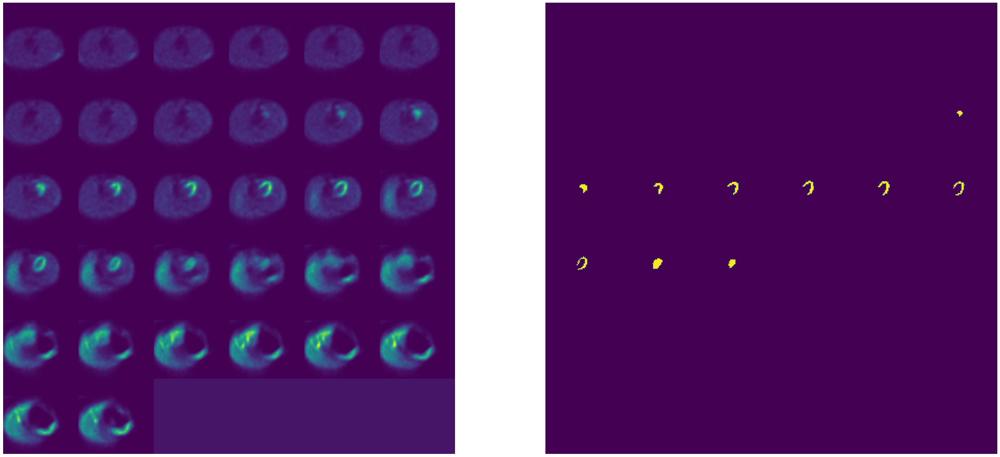

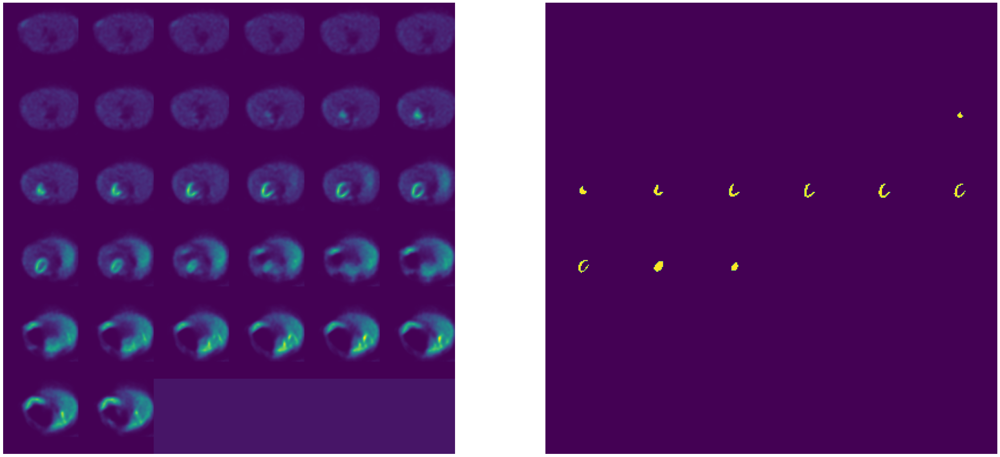

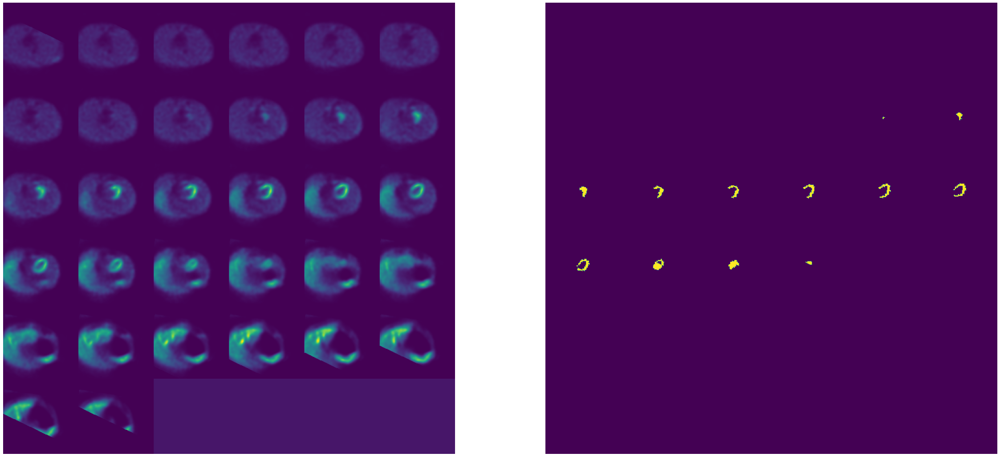

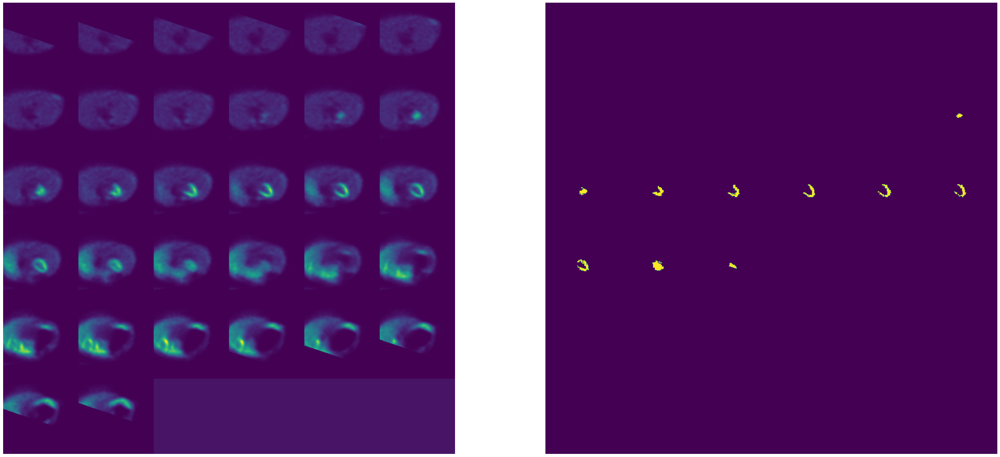

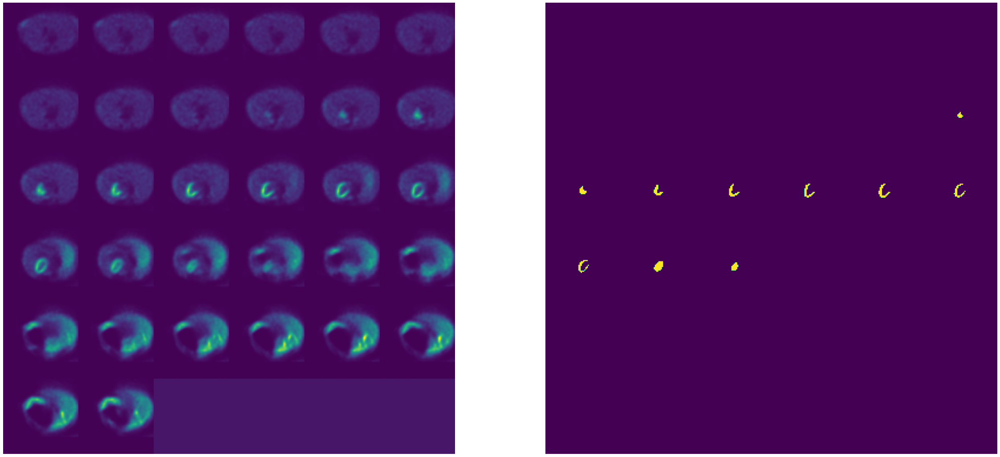

In [11]:
for i in range(10):
    
    transformed_subject = training_transform(one_subject)
    
    image_transformed = transformed_subject.spect.data.numpy()
    mask_transformed = transformed_subject.left_ventricle.data.numpy()[1, ...]

    vis.visualize(
        np.squeeze(image_transformed).swapaxes(1, 2).swapaxes(0, 1), 
        np.squeeze(mask_transformed).swapaxes(1, 2).swapaxes(0, 1)
    )

In [11]:
training_split_ratio = 0.6

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 6 subjects
Validation set: 4 subjects


In [17]:
device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
CHANNELS_DIMENSION = 1
SPATIAL_DIMENSIONS = (2, 3, 4)


class Action(enum.Enum):
    TRAIN = 'Training'
    VALIDATE = 'Validation'
    

def prepare_batch(batch, device):
    
    inputs = batch['spect'][tio.DATA].to(device)
    targets = batch['left_ventricle'][tio.DATA].to(device)
    
    return inputs, targets


def get_dice_score(output, target, epsilon=1e-9):
    
    p0 = output
    g0 = target
    p1 = 1 - p0
    g1 = 1 - g0
    tp = (p0 * g0).sum(dim=SPATIAL_DIMENSIONS)
    fp = (p0 * g1).sum(dim=SPATIAL_DIMENSIONS)
    fn = (p1 * g0).sum(dim=SPATIAL_DIMENSIONS)
    num = 2 * tp
    denom = 2 * tp + fp + fn + epsilon
    dice_score = num / denom
    
    return dice_score


def get_dice_loss(output, target):

    return 1 - get_dice_score(output, target)


def get_model_and_optimizer(device):

    model = UNet(
        in_channels=1,
        out_classes=2,
        dimensions=3,
        num_encoding_blocks=3,
        out_channels_first_layer=8,
        normalization='batch',
        upsampling_type='linear',
        padding=True,
        activation='PReLU',
    ).to(device)
    optimizer = torch.optim.AdamW(model.parameters())
    
    return model, optimizer


def run_epoch(epoch_idx, action, loader, model, optimizer):
    
    is_training = action == Action.TRAIN
    epoch_losses = []
    model.train(is_training)
    
    for batch_idx, batch in enumerate(tqdm(loader)):
        
        inputs, targets = prepare_batch(batch, device)
        optimizer.zero_grad()
    
        with torch.set_grad_enabled(is_training):
        
            logits = model(inputs)
            probabilities = F.softmax(logits, dim=CHANNELS_DIMENSION)
            batch_losses = get_dice_loss(probabilities, targets)
            batch_loss = batch_losses.mean()
            
            if is_training:
            
                batch_loss.backward()
                optimizer.step()
            
            epoch_losses.append(batch_loss.item())
    
    epoch_losses = np.array(epoch_losses).mean()
    
    print(f'{action.value} mean loss: {epoch_losses.mean():0.3f}')
    
    return time.time(), epoch_losses


def train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem):
    
    train_losses = []
    val_losses = []
    val_losses.append(run_epoch(0, Action.VALIDATE, validation_loader, model, optimizer))
    
    for epoch_idx in range(1, num_epochs + 1):
    
        print('Starting epoch', epoch_idx)
        train_losses.append(run_epoch(epoch_idx, Action.TRAIN, training_loader, model, optimizer))
        val_losses.append(run_epoch(epoch_idx, Action.VALIDATE, validation_loader, model, optimizer))
        #torch.save(model.state_dict(), f'{weights_stem}_epoch_{epoch_idx}.pth')
    
    return np.array(train_losses), np.array(val_losses)

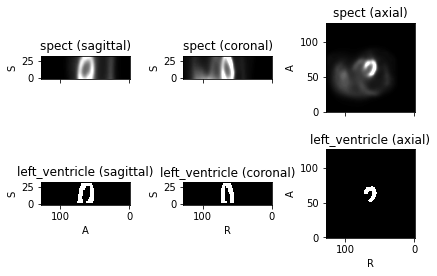

In [13]:
training_set[1].plot()

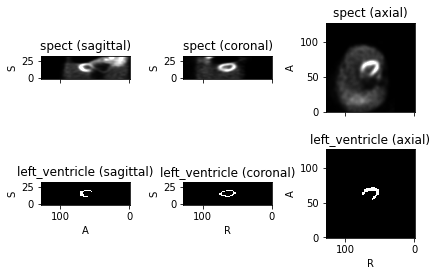

In [14]:
validation_set[0].plot()

In [12]:
#num_workers = 2

training_batch_size = 2
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

In [16]:
one_batch = next(iter(training_loader))

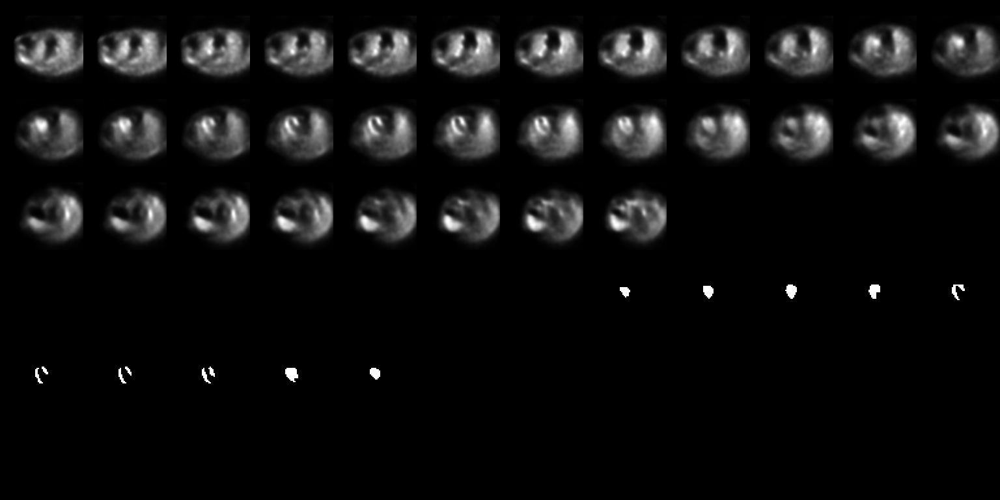

In [17]:
k = 32

batch_spect = one_batch['spect'][tio.DATA][0, ..., :k].permute(3, 0, 1, 2)
batch_label = one_batch['left_ventricle'][tio.DATA][0, 1:, ..., :k].permute(3, 0, 1, 2)

slices = torch.cat((batch_spect, batch_label))
image_path = 'batch_whole_images.png'

torchvision.utils.save_image(
    slices,
    image_path,
    nrow=12,
    normalize=True,
    scale_each=True,
    padding=0,
)
display.Image(image_path)

In [18]:
num_epochs = 200

model, optimizer = get_model_and_optimizer(device)
#weights_path = 'whole_image_state_dict.pth'

weights_stem = 'whole_images'
train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, weights_path)

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


Validation mean loss: 0.646
Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.637


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.636
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.605


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.618
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.594


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.604
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.586


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.593
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.577


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.588
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.569


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.587
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.566


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.578
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.563


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.579
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.556


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.579
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.557


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.580
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.555


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.575
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.549


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.564
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.544


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.559
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.543


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.556
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.538


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.554
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.535


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.553
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.535


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.558
Starting epoch 18


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.530


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.550
Starting epoch 19


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.529


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.547
Starting epoch 20


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.525


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.548
Starting epoch 21


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.522


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.537
Starting epoch 22


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.522


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.531
Starting epoch 23


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.516


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.530
Starting epoch 24


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.516


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.527
Starting epoch 25


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.516


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.526
Starting epoch 26


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.509


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.525
Starting epoch 27


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.508


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.523
Starting epoch 28


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.505


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.518
Starting epoch 29


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.504


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.517
Starting epoch 30


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.500


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.510
Starting epoch 31


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.498


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.508
Starting epoch 32


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.491


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.499
Starting epoch 33


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.492


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.498
Starting epoch 34


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.487


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.496
Starting epoch 35


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.491


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.504
Starting epoch 36


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.482


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.504
Starting epoch 37


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.482


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.495
Starting epoch 38


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.480


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.489
Starting epoch 39


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.474


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.489
Starting epoch 40


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.477


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.494
Starting epoch 41


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.469


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.495
Starting epoch 42


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.466


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.491
Starting epoch 43


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.464


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.483
Starting epoch 44


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.463


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.475
Starting epoch 45


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.460


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.467
Starting epoch 46


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.454


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.468
Starting epoch 47


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.453


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.479
Starting epoch 48


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.451


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.479
Starting epoch 49


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.445


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.468
Starting epoch 50


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.444


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.464
Starting epoch 51


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.444


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.468
Starting epoch 52


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.439


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.467
Starting epoch 53


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.440


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.455
Starting epoch 54


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.441


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.448
Starting epoch 55


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.441


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.454
Starting epoch 56


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.428


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.461
Starting epoch 57


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.424


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.499
Starting epoch 58


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.431


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.438
Starting epoch 59


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.423


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.435
Starting epoch 60


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.419


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.427
Starting epoch 61


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.426


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.457
Starting epoch 62


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.418


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.455
Starting epoch 63


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.420


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.424
Starting epoch 64


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.410


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.413
Starting epoch 65


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.405


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.415
Starting epoch 66


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.404


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.418
Starting epoch 67


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.410


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.427
Starting epoch 68


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.399


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.433
Starting epoch 69


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.394


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.421
Starting epoch 70


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.398


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.422
Starting epoch 71


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.394


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.421
Starting epoch 72


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.401


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.425
Starting epoch 73


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.392


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.459
Starting epoch 74


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.386


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.441
Starting epoch 75


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.389


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.403
Starting epoch 76


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.383


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 77


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.381


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.390
Starting epoch 78


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.369


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.369
Starting epoch 79


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.385
Starting epoch 80


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.372


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.382
Starting epoch 81


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.365


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.363
Starting epoch 82


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.361


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.364
Starting epoch 83


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.363


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.363
Starting epoch 84


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.346
Starting epoch 85


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.347


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.342
Starting epoch 86


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.348


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.343
Starting epoch 87


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.350
Starting epoch 88


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.348


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.335
Starting epoch 89


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.343
Starting epoch 90


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.332


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.336
Starting epoch 91


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.335


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.321
Starting epoch 92


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.332


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.319
Starting epoch 93


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.324


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.332
Starting epoch 94


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.338


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.360
Starting epoch 95


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.328


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.332
Starting epoch 96


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.322


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.305
Starting epoch 97


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.330


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.313
Starting epoch 98


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.324


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.334
Starting epoch 99


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.303


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.318
Starting epoch 100


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.311


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.328
Starting epoch 101


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.305


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.308
Starting epoch 102


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.310


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.312
Starting epoch 103


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.321


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.366
Starting epoch 104


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.318


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.345
Starting epoch 105


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.303


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.300
Starting epoch 106


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.291
Starting epoch 107


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.280


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.289
Starting epoch 108


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.291
Starting epoch 109


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.285


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.262
Starting epoch 110


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.293


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.273
Starting epoch 111


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.287


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.255
Starting epoch 112


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.304


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.280
Starting epoch 113


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.287


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.292
Starting epoch 114


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.273


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.265
Starting epoch 115


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.245
Starting epoch 116


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.278


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.246
Starting epoch 117


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.275


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.339
Starting epoch 118


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.278


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.262
Starting epoch 119


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.262
Starting epoch 120


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.273


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.255
Starting epoch 121


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.279


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.316
Starting epoch 122


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.279


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.286
Starting epoch 123


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.215
Starting epoch 124


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.270


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.215
Starting epoch 125


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.256


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.251
Starting epoch 126


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.271


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.239
Starting epoch 127


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.276


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.284
Starting epoch 128


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.272


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.264
Starting epoch 129


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 130


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.267


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 131


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.253
Starting epoch 132


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.214
Starting epoch 133


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.248


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 134


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.245
Starting epoch 135


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 136


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 137


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.253
Starting epoch 138


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.242


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.225
Starting epoch 139


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 140


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.197
Starting epoch 141


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 142


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 143


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 144


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.199


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.222
Starting epoch 145


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.214
Starting epoch 146


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 147


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.191


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.239
Starting epoch 148


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.241


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.293
Starting epoch 149


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.201


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 150


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.333
Starting epoch 151


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.228


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.372
Starting epoch 152


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.270
Starting epoch 153


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.306
Starting epoch 154


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.227


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.175
Starting epoch 155


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.254


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 156


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.470
Starting epoch 157


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.280


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.266
Starting epoch 158


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.328
Starting epoch 159


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.308
Starting epoch 160


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.199


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.241
Starting epoch 161


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 162


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 163


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 164


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.150
Starting epoch 165


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.210


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.258
Starting epoch 166


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.185


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 167


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 168


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.182


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 169


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 170


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.155


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 171


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.151


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 172


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 173


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.163


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 174


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.213
Starting epoch 175


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 176


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.215
Starting epoch 177


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.185


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.374
Starting epoch 178


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.260


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.190
Starting epoch 179


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 180


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 181


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.166


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.174
Starting epoch 182


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.151
Starting epoch 183


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 184


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.173


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 185


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.155


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.174
Starting epoch 186


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.130


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 187


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.140


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 188


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.180
Starting epoch 189


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.169


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 190


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.160


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.238
Starting epoch 191


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.153


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 192


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.150
Starting epoch 193


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.144


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 194


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.169


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 195


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.151


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 196


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.120


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 197


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.115


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.182
Starting epoch 198


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.127


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 199


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.145


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 200


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.244


In [18]:
def plot_times(axis, losses, label):
    
    times, losses = losses.transpose(1, 0)
    times = [datetime.fromtimestamp(x) for x in times]
    axis.plot(times, losses.flatten(), label=label)
    
    
def plot_epochs(axis, losses, label):
    
    _, losses = losses.transpose(1, 0)
    epochs = [i for i in range(1, len(losses.flatten()) + 1)]
    axis.plot(epochs, losses.flatten())

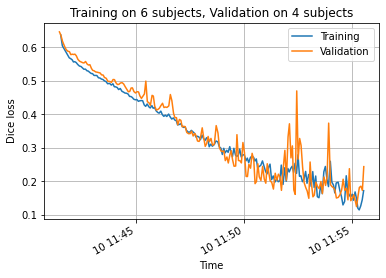

In [20]:
fig, ax = plt.subplots()
plot_times(ax, train_losses, 'Training')
plot_times(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Time')
ax.set_ylabel('Dice loss')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
ax.legend()
fig.autofmt_xdate()

No handles with labels found to put in legend.


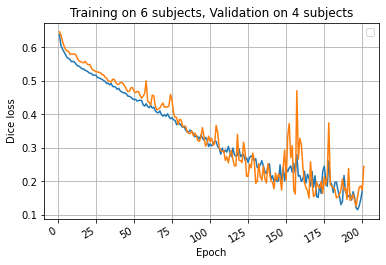

In [21]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Dice loss')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
ax.legend()
fig.autofmt_xdate()

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


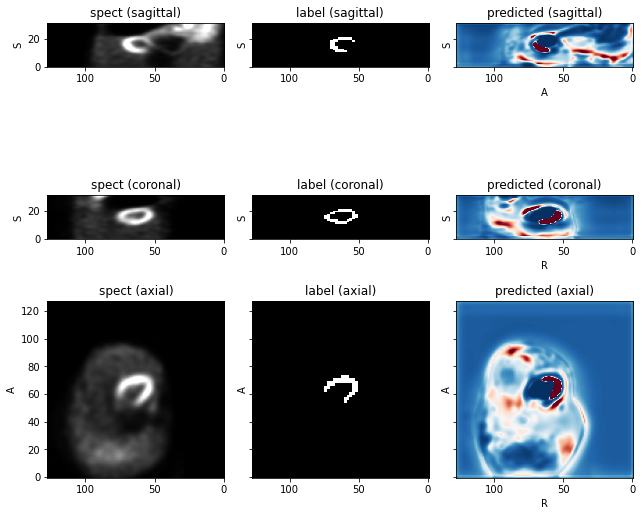

In [22]:
batch = next(iter(validation_loader))

model.eval()

inputs, targets = prepare_batch(batch, device)
FIRST = 0
FOREGROUND = 1

with torch.no_grad():

    probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()

affine = batch['spect'][tio.AFFINE][0].numpy()

subject = tio.Subject(
    spect=tio.ScalarImage(tensor=batch['spect'][tio.DATA][FIRST], affine=affine),
    label=tio.LabelMap(tensor=batch['left_ventricle'][tio.DATA][FIRST], affine=affine),
    predicted=tio.ScalarImage(tensor=probabilities[FIRST], affine=affine),
)
subject.plot(figsize=(9, 8), cmap_dict={'predicted': 'RdBu_r'})

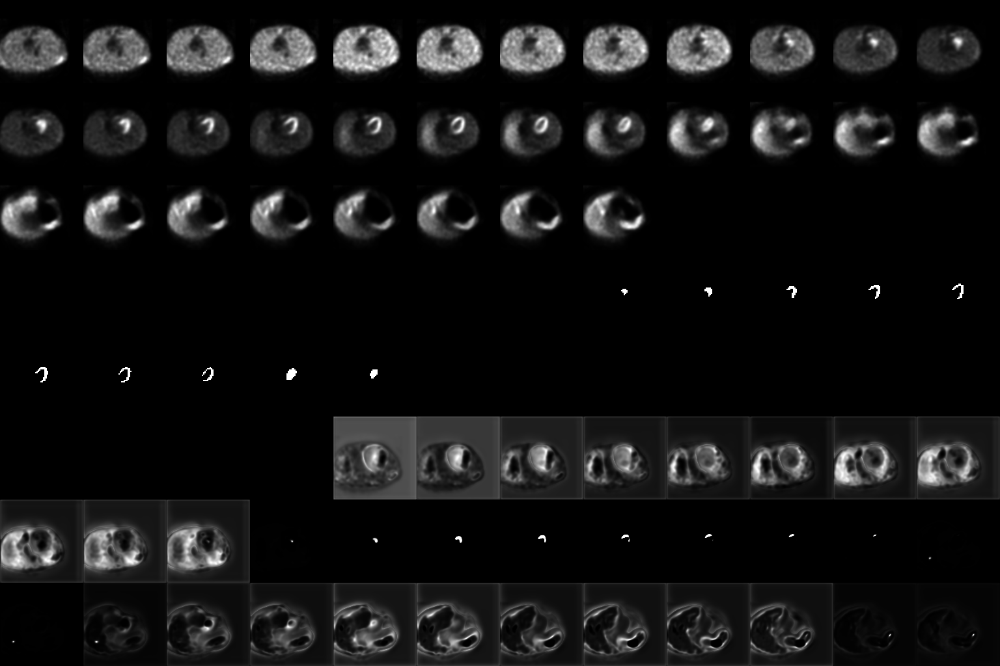

In [23]:
k = 32

batch_spect = batch['spect'][tio.DATA][FIRST].permute(3, 0, 1, 2)
batch_label = batch['left_ventricle'][tio.DATA][FIRST][1:, ...].permute(3, 0, 1, 2)
batch_pred = probabilities[FIRST].permute(3, 0, 1, 2)

slices = torch.cat((batch_spect, batch_label, batch_pred))
image_path = 'prediction.png'

torchvision.utils.save_image(
    slices,
    image_path,
    nrow=12,
    normalize=True,
    scale_each=True,
    padding=0,
)
display.Image(image_path)

  0%|          | 0/1 [00:00<?, ?it/s]

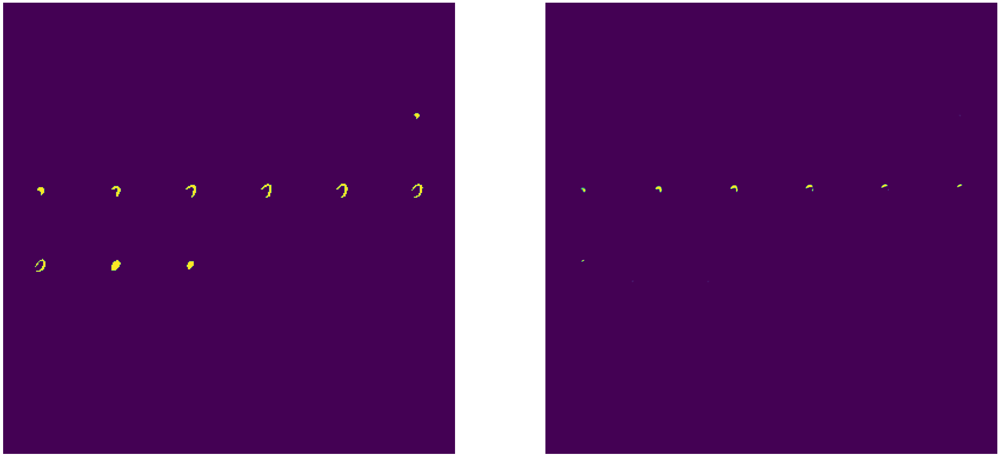

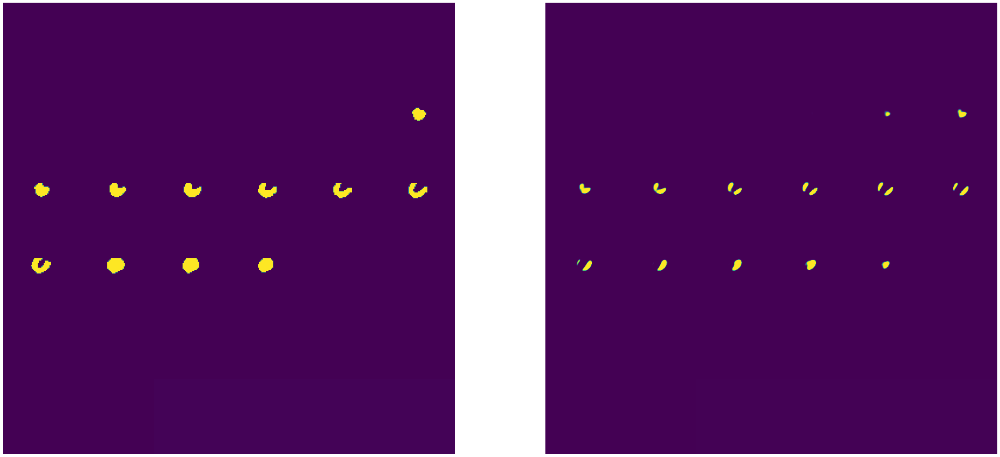

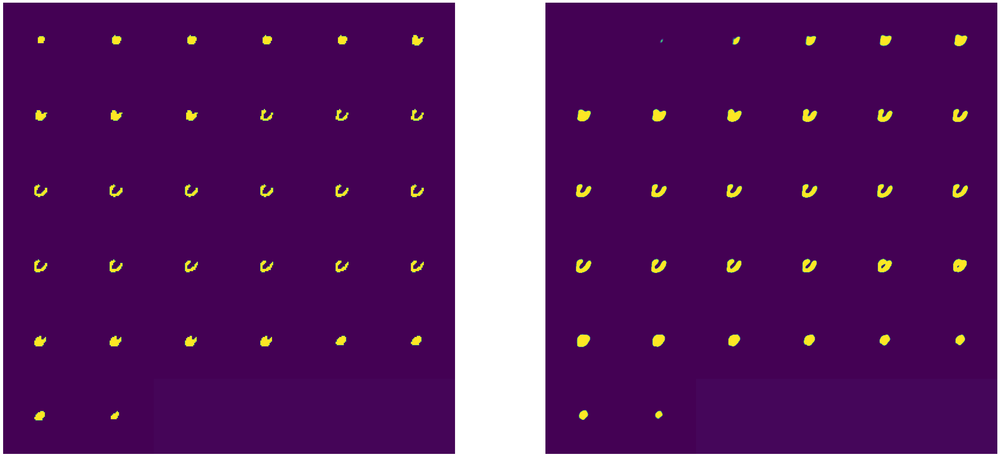

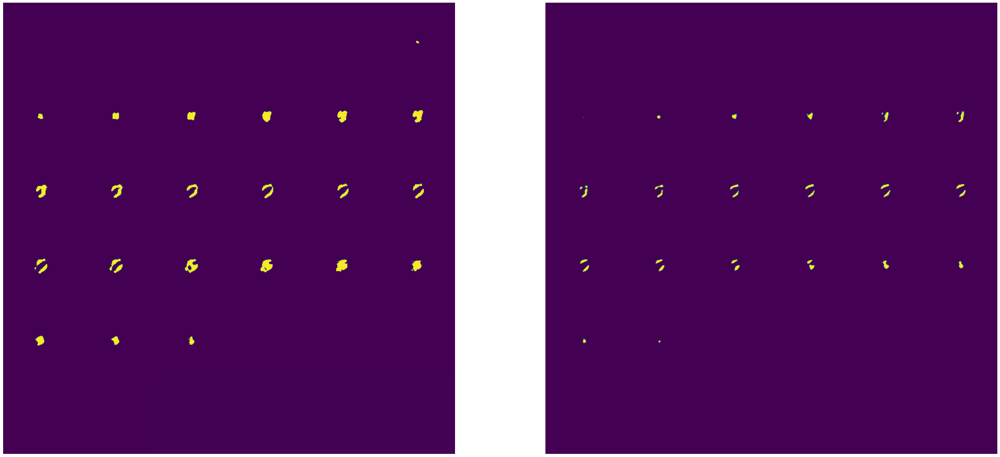

In [25]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()
        
    
    for i in range(len(batch['spect'][tio.DATA])):
    
        spect = batch['spect'][tio.DATA][i].permute(3, 0, 1, 2)
        label = batch['left_ventricle'][tio.DATA][i][1:, ...].permute(3, 0, 1, 2)
        pred = probabilities[i].permute(3, 0, 1, 2)
        
        vis.visualize(
            np.squeeze(label.permute(1,0,2,3).numpy(), axis=0),
            np.squeeze(pred.permute(1,0,2,3).numpy(), axis=0)
        )

## Use Instance Normalization + Dropout

In [19]:
def get_model_and_optimizer(device):

    model = UNet(
        in_channels=1,
        out_classes=2,
        dimensions=3,
        num_encoding_blocks=3,
        out_channels_first_layer=8,
        normalization='instance',
        upsampling_type='linear',
        padding=True,
        activation='PReLU',
        dropout=0.3
    ).to(device)
    optimizer = torch.optim.AdamW(model.parameters())
    
    return model, optimizer

In [27]:
num_epochs = 600

model, optimizer = get_model_and_optimizer(device)
#weights_path = 'whole_image_state_dict.pth'

weights_stem = 'whole_images'
train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, weights_path)

  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.628
Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.620


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.615
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.603


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.606
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.596


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.601
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.589


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.597
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.599


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.595
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.592


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.592
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.577


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.588
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.571


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.585
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.585


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.581
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.572


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.573
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.566


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.568
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.569


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.564
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.557


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.560
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.558


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.559
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.553


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.557
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.554


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.554
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.545


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.551
Starting epoch 18


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.554


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.547
Starting epoch 19


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.548


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.544
Starting epoch 20


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.546


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.541
Starting epoch 21


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.541


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.539
Starting epoch 22


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.537


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.537
Starting epoch 23


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.522


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.534
Starting epoch 24


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.530


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.532
Starting epoch 25


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.530


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.531
Starting epoch 26


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.513


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.528
Starting epoch 27


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.526


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.524
Starting epoch 28


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.504


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.522
Starting epoch 29


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.513


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.522
Starting epoch 30


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.510


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.520
Starting epoch 31


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.512


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.517
Starting epoch 32


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.527


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.513
Starting epoch 33


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.506


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.510
Starting epoch 34


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.507


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.508
Starting epoch 35


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.517


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.507
Starting epoch 36


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.488


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.504
Starting epoch 37


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.501


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.502
Starting epoch 38


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.491


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.500
Starting epoch 39


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.502


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.498
Starting epoch 40


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.479


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.496
Starting epoch 41


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.486


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.492
Starting epoch 42


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.490


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.489
Starting epoch 43


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.486


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.489
Starting epoch 44


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.496


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.488
Starting epoch 45


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.494


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.488
Starting epoch 46


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.499


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.487
Starting epoch 47


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.478


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.484
Starting epoch 48


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.498


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.481
Starting epoch 49


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.477


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.477
Starting epoch 50


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.469


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.476
Starting epoch 51


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.470


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.474
Starting epoch 52


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.474


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.471
Starting epoch 53


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.484


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.467
Starting epoch 54


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.488


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.467
Starting epoch 55


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.469


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.466
Starting epoch 56


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.469


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.462
Starting epoch 57


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.467


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.458
Starting epoch 58


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.449


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.453
Starting epoch 59


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.446


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.449
Starting epoch 60


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.436


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.450
Starting epoch 61


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.445


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.448
Starting epoch 62


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.446


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.448
Starting epoch 63


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.462


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.444
Starting epoch 64


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.444


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.440
Starting epoch 65


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.437


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.439
Starting epoch 66


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.451


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.439
Starting epoch 67


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.425


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.437
Starting epoch 68


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.410


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.433
Starting epoch 69


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.448


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.428
Starting epoch 70


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.411


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.425
Starting epoch 71


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.467


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.430
Starting epoch 72


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.428


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.435
Starting epoch 73


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.421


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.434
Starting epoch 74


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.437


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.428
Starting epoch 75


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.415


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.419
Starting epoch 76


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.418


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.409
Starting epoch 77


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.434


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.403
Starting epoch 78


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.423


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.402
Starting epoch 79


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.393


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.406
Starting epoch 80


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.418


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.409
Starting epoch 81


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.393


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.408
Starting epoch 82


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.407


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.401
Starting epoch 83


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.429


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.392
Starting epoch 84


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.430


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.384
Starting epoch 85


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.404


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.379
Starting epoch 86


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.412


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.377
Starting epoch 87


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.410


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.377
Starting epoch 88


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.385


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.381
Starting epoch 89


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.387


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.381
Starting epoch 90


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.388


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.375
Starting epoch 91


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.378


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.373
Starting epoch 92


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.376


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.368
Starting epoch 93


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.419


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.360
Starting epoch 94


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.355
Starting epoch 95


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.381


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.351
Starting epoch 96


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.391


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.351
Starting epoch 97


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.387


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.349
Starting epoch 98


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.426


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.345
Starting epoch 99


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.409


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.349
Starting epoch 100


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.338


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.348
Starting epoch 101


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.408


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.347
Starting epoch 102


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.367


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.341
Starting epoch 103


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.385


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.337
Starting epoch 104


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.330
Starting epoch 105


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.356


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.322
Starting epoch 106


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.315
Starting epoch 107


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.342


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.307
Starting epoch 108


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.312


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.310
Starting epoch 109


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.360


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.309
Starting epoch 110


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.342


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.307
Starting epoch 111


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.340


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.303
Starting epoch 112


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.338


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.304
Starting epoch 113


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.370


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.310
Starting epoch 114


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.305
Starting epoch 115


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.329


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.293
Starting epoch 116


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.290
Starting epoch 117


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.359


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.290
Starting epoch 118


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.347


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.310
Starting epoch 119


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.336


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.312
Starting epoch 120


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.360


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.317
Starting epoch 121


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.320


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.321
Starting epoch 122


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.373


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.329
Starting epoch 123


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.378


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.331
Starting epoch 124


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.328
Starting epoch 125


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.352


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.320
Starting epoch 126


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.361


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.313
Starting epoch 127


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.355


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.304
Starting epoch 128


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.305


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.296
Starting epoch 129


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.330


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.286
Starting epoch 130


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.366


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.286
Starting epoch 131


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.360


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.281
Starting epoch 132


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.312


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.272
Starting epoch 133


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.319


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.272
Starting epoch 134


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.294


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.265
Starting epoch 135


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.361


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.263
Starting epoch 136


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.362


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.276
Starting epoch 137


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.296


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.282
Starting epoch 138


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.322


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.290
Starting epoch 139


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.376


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.296
Starting epoch 140


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.391


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.302
Starting epoch 141


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.359


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.296
Starting epoch 142


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.301


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271
Starting epoch 143


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.265
Starting epoch 144


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.317


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.263
Starting epoch 145


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.339


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.264
Starting epoch 146


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.263
Starting epoch 147


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.329


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.262
Starting epoch 148


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.285


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.254
Starting epoch 149


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.310


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.242
Starting epoch 150


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.351


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.231
Starting epoch 151


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.353


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.228
Starting epoch 152


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.292


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.233
Starting epoch 153


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.335


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.242
Starting epoch 154


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.306


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.246
Starting epoch 155


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.289


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.240
Starting epoch 156


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.331


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.245
Starting epoch 157


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.355


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.263
Starting epoch 158


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.294


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.278
Starting epoch 159


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.360


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.279
Starting epoch 160


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.343


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.266
Starting epoch 161


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.334


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.247
Starting epoch 162


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.369


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.253
Starting epoch 163


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.295


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.260
Starting epoch 164


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.354


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271
Starting epoch 165


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.321


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271
Starting epoch 166


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.322


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.273
Starting epoch 167


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.303


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.268
Starting epoch 168


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.329


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.259
Starting epoch 169


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.306


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.241
Starting epoch 170


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.335


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.233
Starting epoch 171


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.325


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.233
Starting epoch 172


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.298


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.234
Starting epoch 173


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.283


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.232
Starting epoch 174


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.320


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.217
Starting epoch 175


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.296


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 176


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.298


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.213
Starting epoch 177


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.279


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 178


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.291


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.229
Starting epoch 179


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.236
Starting epoch 180


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.236
Starting epoch 181


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.237
Starting epoch 182


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.295


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.222
Starting epoch 183


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.209
Starting epoch 184


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 185


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.259


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.192
Starting epoch 186


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.271


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 187


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.340


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 188


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.392


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.235
Starting epoch 189


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.320


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.252
Starting epoch 190


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.281


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.265
Starting epoch 191


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.340


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271
Starting epoch 192


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.336


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271
Starting epoch 193


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.304


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.262
Starting epoch 194


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.329


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.254
Starting epoch 195


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.277


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.244
Starting epoch 196


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.317


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.235
Starting epoch 197


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.318


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.229
Starting epoch 198


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.295


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 199


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.283


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.227
Starting epoch 200


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.233
Starting epoch 201


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.289


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.228
Starting epoch 202


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.308


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.223
Starting epoch 203


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.230
Starting epoch 204


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.274


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.233
Starting epoch 205


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.258


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.225
Starting epoch 206


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.295


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.222
Starting epoch 207


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.273


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.212
Starting epoch 208


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.206
Starting epoch 209


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.295


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.191
Starting epoch 210


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.237


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 211


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.380


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 212


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.280


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 213


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.259


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.213
Starting epoch 214


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.346


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.209
Starting epoch 215


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.260


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 216


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.311


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 217


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.298


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 218


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.319


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.225
Starting epoch 219


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.302


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 220


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.301


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 221


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.274


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 222


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.270


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 223


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.310


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 224


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 225


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.306


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 226


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 227


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.283


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 228


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.300


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 229


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.308


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 230


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.292


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.199
Starting epoch 231


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.302


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.191
Starting epoch 232


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.304


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 233


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.282


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 234


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.277


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 235


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.208
Starting epoch 236


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.262


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 237


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.309


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 238


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.225
Starting epoch 239


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.267


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.220
Starting epoch 240


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.303


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.206
Starting epoch 241


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.309


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 242


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.272


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 243


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 244


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 245


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 246


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.289


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.175
Starting epoch 247


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.265


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 248


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.315


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 249


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 250


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.275


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.174
Starting epoch 251


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.325


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 252


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 253


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.286


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.182
Starting epoch 254


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.260


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 255


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.297


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 256


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.300


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 257


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.308


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 258


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.290


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 259


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.298


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 260


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.279


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.208
Starting epoch 261


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.292


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.215
Starting epoch 262


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.314


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 263


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.287


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.214
Starting epoch 264


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.273


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 265


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.299


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 266


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.259


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 267


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.301


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.184
Starting epoch 268


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 269


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.238


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 270


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.292


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 271


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 272


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.241


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 273


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.311


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 274


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.248


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 275


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 276


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.288


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 277


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.285


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.206
Starting epoch 278


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.326


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 279


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 280


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.283


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.192
Starting epoch 281


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.182
Starting epoch 282


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.265


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 283


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 284


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.237


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 285


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.255


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 286


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.248


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 287


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 288


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 289


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 290


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 291


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.272


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 292


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 293


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.253


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 294


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.269


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 295


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.234


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 296


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.237


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 297


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 298


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 299


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.251


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.170
Starting epoch 300


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 301


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 302


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.300


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.151
Starting epoch 303


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.281


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.147
Starting epoch 304


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.308


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 305


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 306


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.271


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 307


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.242


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 308


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 309


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.253


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 310


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.180
Starting epoch 311


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 312


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.264


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 313


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 314


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.262


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 315


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 316


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130
Starting epoch 317


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 318


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.250


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.127
Starting epoch 319


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.227


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.127
Starting epoch 320


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.219


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 321


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.338


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 322


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.243


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 323


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.271


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 324


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.242


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 325


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.247


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 326


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.286


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 327


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 328


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.265


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 329


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.294


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 330


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 331


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 332


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 333


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 334


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.263


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.184
Starting epoch 335


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 336


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 337


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.212


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 338


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 339


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.319


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.176
Starting epoch 340


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.234


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 341


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.234


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.191
Starting epoch 342


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 343


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.258


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 344


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.210


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 345


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.303


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 346


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.290


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 347


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 348


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.287


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 349


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 350


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.322


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 351


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 352


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 353


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.193


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 354


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.218


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 355


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.259


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.134
Starting epoch 356


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.294


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 357


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.273


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 358


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.212


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 359


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 360


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.219


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 361


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 362


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 363


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.257


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 364


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 365


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.288


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 366


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.310


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.201
Starting epoch 367


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.277


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.199
Starting epoch 368


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 369


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.174
Starting epoch 370


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 371


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 372


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.226


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 373


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.277


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 374


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.281


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 375


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 376


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 377


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 378


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.234


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 379


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 380


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.170
Starting epoch 381


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.238


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 382


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 383


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.278


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 384


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 385


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 386


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.253


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 387


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.263


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.151
Starting epoch 388


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.290


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 389


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.247


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 390


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.147
Starting epoch 391


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 392


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.300


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 393


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.251


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 394


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.238


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 395


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 396


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 397


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.282


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 398


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.287


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 399


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 400


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 401


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 402


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 403


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 404


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.226


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 405


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 406


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 407


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.296


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 408


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.245


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 409


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.170
Starting epoch 410


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 411


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.246


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 412


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.267


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 413


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 414


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.256


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 415


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.126
Starting epoch 416


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.127
Starting epoch 417


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 418


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.267


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 419


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 420


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 421


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 422


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 423


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.197


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 424


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 425


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 426


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 427


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.140
Starting epoch 428


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.261


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 429


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 430


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 431


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 432


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.255


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 433


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 434


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.225


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 435


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.176
Starting epoch 436


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 437


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.176
Starting epoch 438


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.241


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 439


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.219


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 440


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 441


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 442


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 443


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.274


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 444


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 445


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 446


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.286


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 447


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 448


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.238


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 449


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 450


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.253


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 451


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 452


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130
Starting epoch 453


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.128
Starting epoch 454


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.289


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.134
Starting epoch 455


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.252


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 456


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.279


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 457


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 458


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 459


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 460


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 461


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.247


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 462


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 463


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.250


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 464


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 465


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.225


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.140
Starting epoch 466


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.186


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 467


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 468


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.226


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 469


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.250


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 470


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 471


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.183


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 472


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.228


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 473


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 474


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.200


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 475


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.197


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 476


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 477


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.243


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 478


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 479


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 480


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 481


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.242


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 482


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.234


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.150
Starting epoch 483


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.226


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 484


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.277


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 485


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.298


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 486


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.140
Starting epoch 487


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 488


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.187


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 489


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.212


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 490


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.179


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 491


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 492


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 493


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 494


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.126
Starting epoch 495


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.120
Starting epoch 496


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115
Starting epoch 497


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.240


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.114
Starting epoch 498


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.113
Starting epoch 499


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115
Starting epoch 500


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.122
Starting epoch 501


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.128
Starting epoch 502


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 503


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 504


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 505


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.250


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 506


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 507


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.150
Starting epoch 508


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 509


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.150
Starting epoch 510


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 511


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 512


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.231


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 513


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 514


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.251


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.124
Starting epoch 515


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.127
Starting epoch 516


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 517


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 518


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 519


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.218


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 520


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.180
Starting epoch 521


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 522


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 523


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 524


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 525


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 526


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.229


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 527


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130
Starting epoch 528


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130
Starting epoch 529


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 530


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 531


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 532


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.193


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 533


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 534


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.227


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.145
Starting epoch 535


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 536


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.175


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 537


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.181


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.120
Starting epoch 538


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.285


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.117
Starting epoch 539


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.239


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.114
Starting epoch 540


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.233


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115
Starting epoch 541


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.118
Starting epoch 542


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.147


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.120
Starting epoch 543


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130
Starting epoch 544


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 545


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.219


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 546


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.254


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 547


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.218


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 548


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.197


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 549


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 550


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.126
Starting epoch 551


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.271


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.120
Starting epoch 552


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.249


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.120
Starting epoch 553


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.182


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.124
Starting epoch 554


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.171


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.134
Starting epoch 555


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.176


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 556


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.175
Starting epoch 557


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.241


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 558


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 559


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 560


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 561


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.126
Starting epoch 562


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.113
Starting epoch 563


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.109
Starting epoch 564


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.111
Starting epoch 565


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.238


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.122
Starting epoch 566


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 567


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.274


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 568


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.185


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 569


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.227


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 570


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 571


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 572


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 573


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.212


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 574


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.147
Starting epoch 575


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.201


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141
Starting epoch 576


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 577


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.181


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 578


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.266


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 579


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.174


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 580


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144
Starting epoch 581


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.151
Starting epoch 582


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 583


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 584


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 585


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 586


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.135
Starting epoch 587


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 588


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.278


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.128
Starting epoch 589


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.221


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 590


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.177


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.139
Starting epoch 591


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 592


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.250


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 593


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.235


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 594


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.197


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 595


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148
Starting epoch 596


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.178


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 597


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 598


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.185


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 599


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.155


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 600


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132


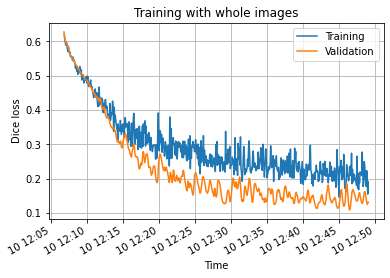

In [28]:
fig, ax = plt.subplots()
plot_times(ax, train_losses, 'Training')
plot_times(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Time')
ax.set_ylabel('Dice loss')
ax.set_title('Training with whole images')
ax.legend()
fig.autofmt_xdate()

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


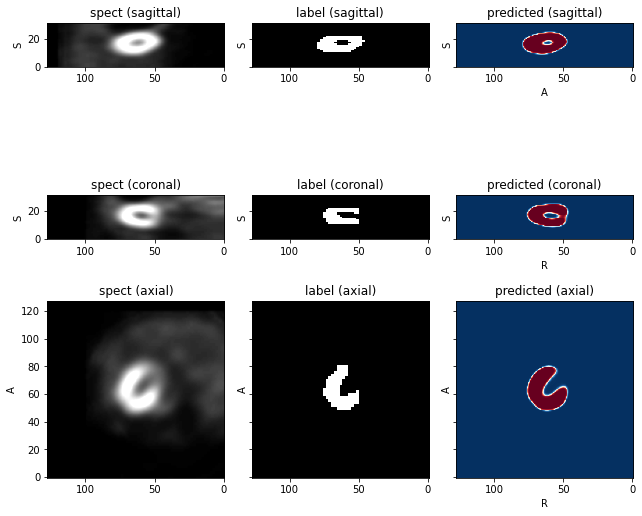

In [29]:
batch = next(iter(validation_loader))

model.eval()

inputs, targets = prepare_batch(batch, device)
FIRST = 1
FOREGROUND = 1

with torch.no_grad():

    probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()

affine = batch['spect'][tio.AFFINE][0].numpy()

subject = tio.Subject(
    spect=tio.ScalarImage(tensor=batch['spect'][tio.DATA][FIRST], affine=affine),
    label=tio.LabelMap(tensor=batch['left_ventricle'][tio.DATA][FIRST], affine=affine),
    predicted=tio.ScalarImage(tensor=probabilities[FIRST], affine=affine),
)
subject.plot(figsize=(9, 8), cmap_dict={'predicted': 'RdBu_r'})

  0%|          | 0/1 [00:00<?, ?it/s]

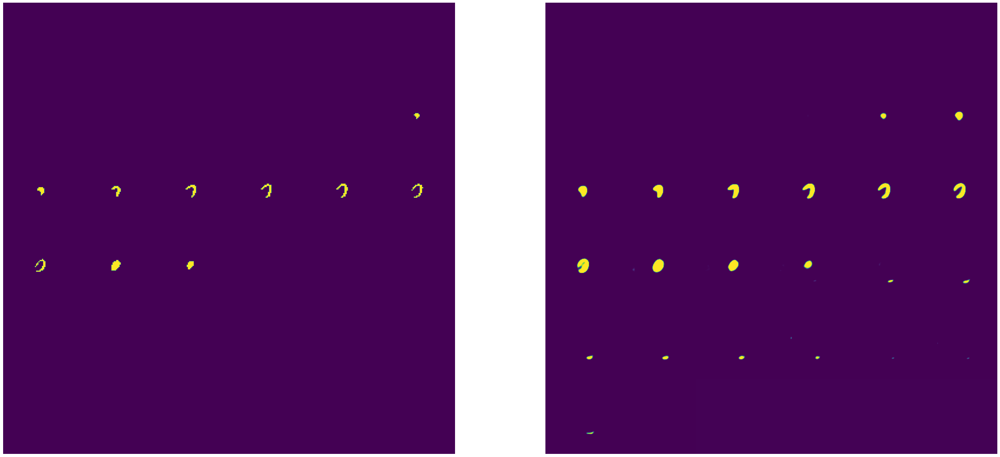

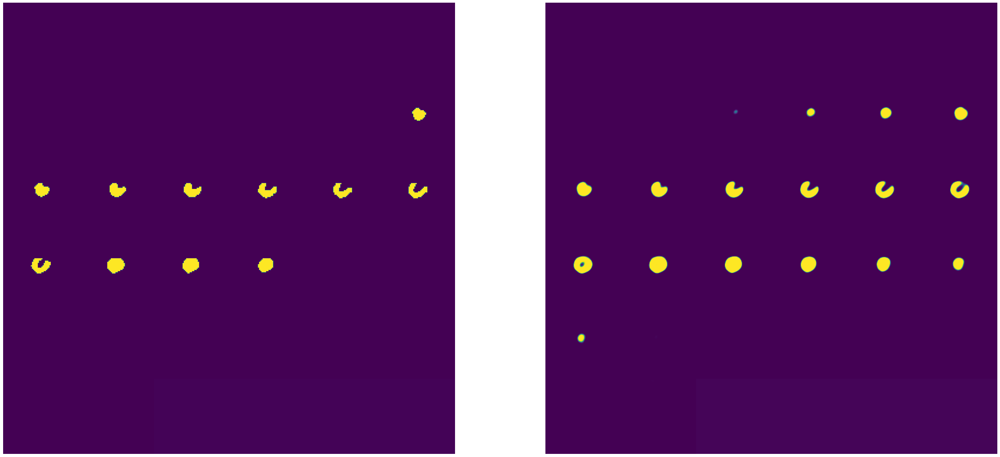

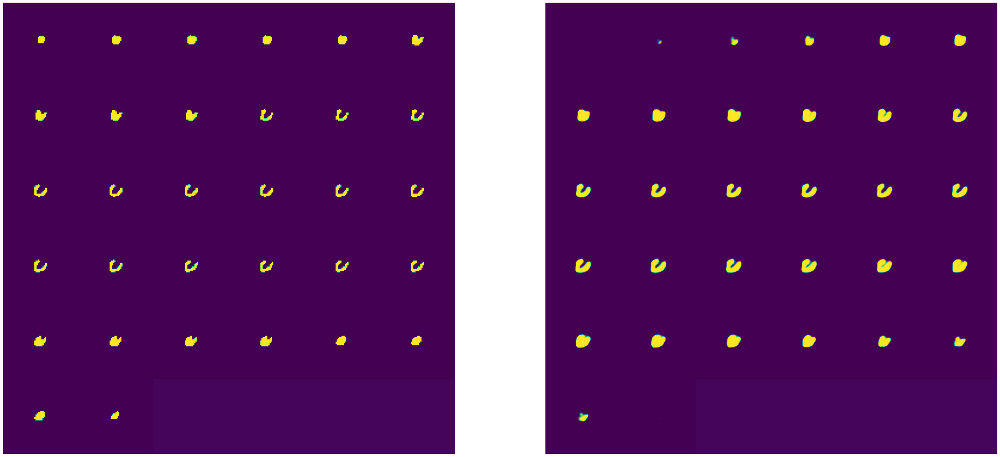

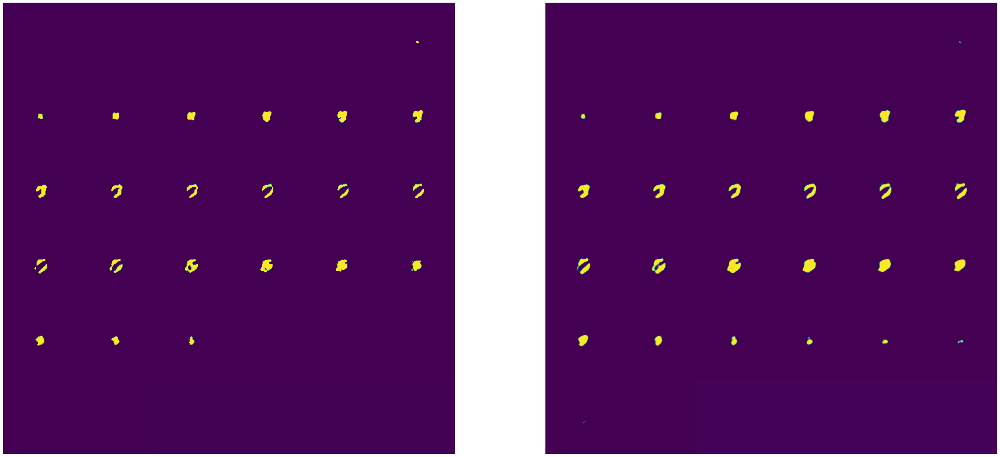

In [30]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()
        
    
    for i in range(len(batch['spect'][tio.DATA])):
    
        spect = batch['spect'][tio.DATA][i].permute(3, 0, 1, 2)
        label = batch['left_ventricle'][tio.DATA][i][1:, ...].permute(3, 0, 1, 2)
        pred = probabilities[i].permute(3, 0, 1, 2)
        
        vis.visualize(
            np.squeeze(label.permute(1,0,2,3).numpy(), axis=0),
            np.squeeze(pred.permute(1,0,2,3).numpy(), axis=0)
        )

In [20]:
def compute_metrics(prediction, target):
    
    pred = prediction.argmax(dim=1)
    targ = target.argmax(dim=1)
    p1 = 1 - pred
    g1 = 1 - targ
    
    tp = (targ * pred).sum(dim=(1, 2, 3))
    fp = (pred * g1).sum(dim=(1, 2, 3))
    fn = (p1 * targ).sum(dim=(1, 2, 3))
    
    precision = (tp / (tp + fp)).mean().cpu().numpy().item()
    recall = (tp / (tp + fn)).mean().cpu().numpy().item()
    iou = (tp / (tp + fp + fn)).mean().cpu().numpy().item()
    
    return precision, recall, iou

## Save model

In [151]:
exp_name = 'unet3d_instance_norm_dropout'

In [91]:
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

In [152]:
checkpoint = torch.load(os.path.join(path_saved_models, f'{exp_name}.pth'))

model.load_state_dict(checkpoint['weights'])

<All keys matched successfully>

In [153]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        predictions = model(inputs).softmax(dim=1)

precision, recall, iou = compute_metrics(predictions, targets)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"IoU: {iou:.4f}")

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


Precision: 0.6191
Recall: 0.9573
IoU: 0.6007


## Focal loss, Precision, Recall, F1-score, IoU, Dice

In [21]:
def run_epoch(epoch_idx, action, loader, model, optimizer):
    
    is_training = action == Action.TRAIN
    epoch_losses = []
    model.train(is_training)
    
    for batch_idx, batch in enumerate(tqdm(loader)):
        
        inputs, targets = prepare_batch(batch, device)
        optimizer.zero_grad()
    
        with torch.set_grad_enabled(is_training):
        
            logits = model(inputs)
            probabilities = F.softmax(logits, dim=CHANNELS_DIMENSION)
            
            batch_losses = sigmoid_focal_loss(probabilities, targets, gamma=GAMMA)
            
            batch_loss = batch_losses.mean()
            
            if is_training:
            
                batch_loss.backward()
                optimizer.step()
            
            epoch_losses.append(batch_loss.item())
    
    epoch_losses = np.array(epoch_losses).mean()
    
    print(f'{action.value} mean loss: {epoch_losses.mean():0.3f}')
    
    return time.time(), epoch_losses


In [33]:
exp_name = 'instance_norm_dropout_focal'

GAMMA = 1
num_epochs = 100

model, optimizer = get_model_and_optimizer(device)

weights_stem = 'whole_images'  # should be dropped ...

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.266
Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.260


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.246
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.244


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.239
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.236


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.235
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.231


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.232
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.231


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.230
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.228
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.226
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.228


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.232


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.228


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.222
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.230


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.220
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.219
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.227


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.223


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.217
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.217
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.215
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.214
Starting epoch 18


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.213
Starting epoch 19


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.224


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.212
Starting epoch 20


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.218


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.212
Starting epoch 21


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.208


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.212
Starting epoch 22


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.206


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 23


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 24


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.222


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.209
Starting epoch 25


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.208
Starting epoch 26


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 27


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.206
Starting epoch 28


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.205
Starting epoch 29


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 30


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 31


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 32


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.201
Starting epoch 33


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 34


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.199
Starting epoch 35


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 36


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 37


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 38


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.199


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 39


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.200


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 40


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 41


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.201


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 42


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.201


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 43


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.199


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.192
Starting epoch 44


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.191


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.190
Starting epoch 45


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.204


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 46


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 47


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.196


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 48


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 49


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.201


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 50


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 51


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 52


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.184


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 53


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.187


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.184
Starting epoch 54


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.187


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.183
Starting epoch 55


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.182
Starting epoch 56


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 57


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.180
Starting epoch 58


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.180


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 59


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 60


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.183


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 61


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 62


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 63


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.178


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 64


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.177


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.176
Starting epoch 65


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.175
Starting epoch 66


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.176


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.174
Starting epoch 67


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.179


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 68


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.165


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 69


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.184


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 70


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.170
Starting epoch 71


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.178


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 72


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.171


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 73


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.165


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 74


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.182


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 75


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.175


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.168
Starting epoch 76


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.170


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 77


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 78


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.176


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 79


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 80


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.177


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.165
Starting epoch 81


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.174


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 82


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.170


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 83


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 84


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.159


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 85


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.170


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.162
Starting epoch 86


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.171


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 87


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.160
Starting epoch 88


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.156


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 89


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.163


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.159
Starting epoch 90


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.158
Starting epoch 91


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.170


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 92


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.166


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 93


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.159


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 94


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.165


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 95


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.159


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 96


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.166


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.156
Starting epoch 97


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 98


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.160


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155
Starting epoch 99


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.164


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 100


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.163


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154


No handles with labels found to put in legend.


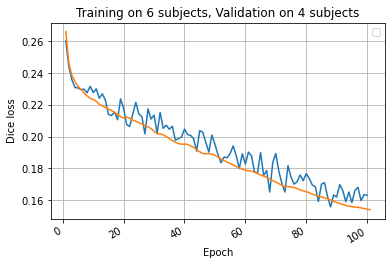

In [34]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Dice loss')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
ax.legend()
fig.autofmt_xdate()

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


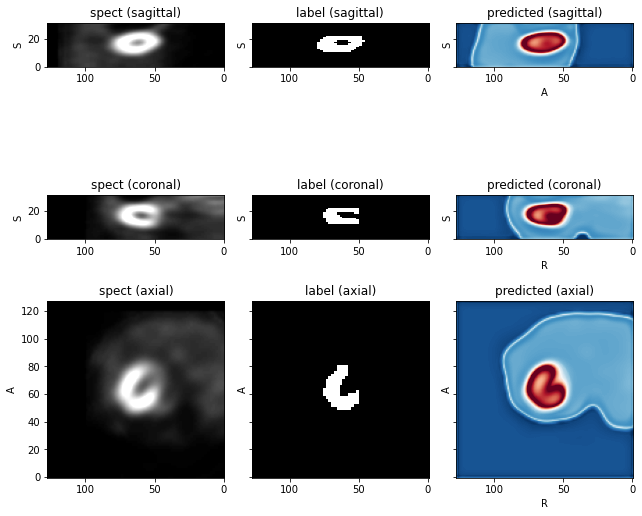

In [35]:
batch = next(iter(validation_loader))

model.eval()

inputs, targets = prepare_batch(batch, device)
FIRST = 1
FOREGROUND = 1

with torch.no_grad():

    probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()

affine = batch['spect'][tio.AFFINE][0].numpy()

subject = tio.Subject(
    spect=tio.ScalarImage(tensor=batch['spect'][tio.DATA][FIRST], affine=affine),
    label=tio.LabelMap(tensor=batch['left_ventricle'][tio.DATA][FIRST], affine=affine),
    predicted=tio.ScalarImage(tensor=probabilities[FIRST], affine=affine),
)
subject.plot(figsize=(9, 8), cmap_dict={'predicted': 'RdBu_r'})

  0%|          | 0/1 [00:00<?, ?it/s]

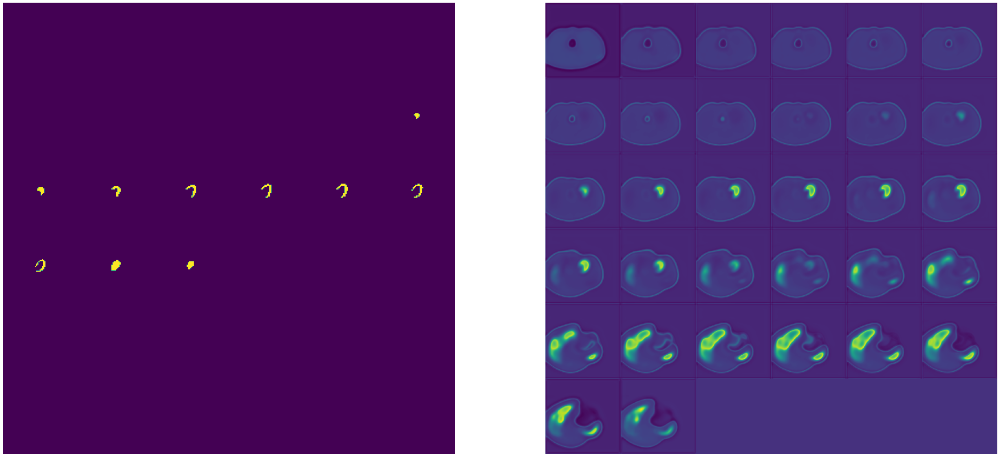

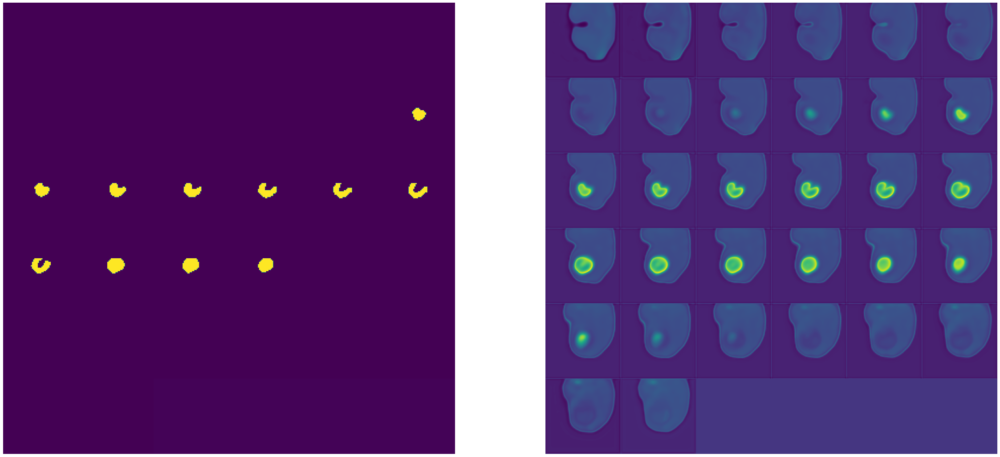

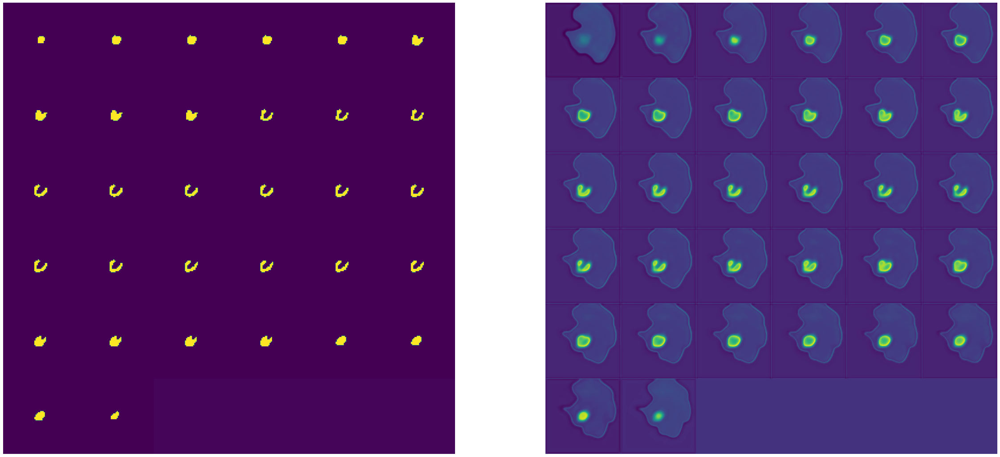

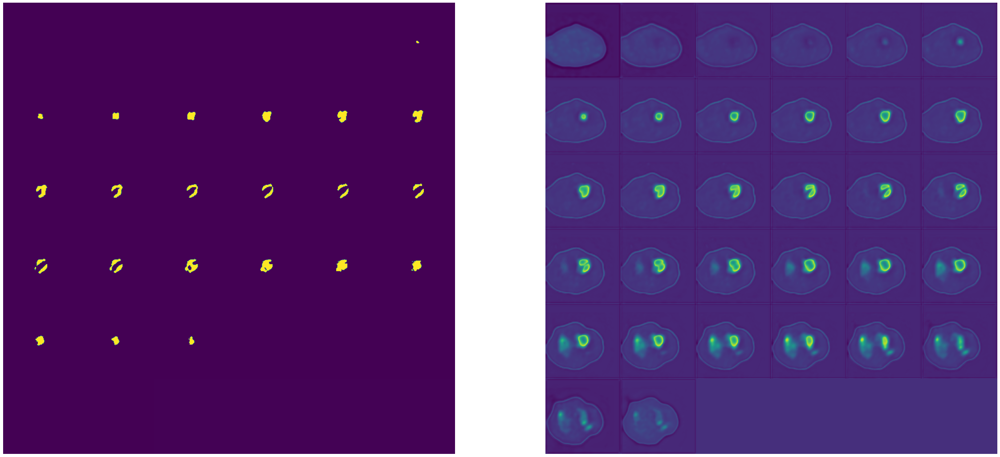

In [36]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()
        
    
    for i in range(len(batch['spect'][tio.DATA])):
    
        spect = batch['spect'][tio.DATA][i].permute(3, 0, 1, 2)
        label = batch['left_ventricle'][tio.DATA][i][1:, ...].permute(3, 0, 1, 2)
        pred = probabilities[i].permute(3, 0, 1, 2)
        
        vis.visualize(
            np.squeeze(label.permute(1,0,2,3).numpy(), axis=0),
            np.squeeze(pred.permute(1,0,2,3).numpy(), axis=0)
        )

In [41]:
exp_name = 'instance_norm_dropout_focal'

GAMMA = 2
num_epochs = 300

model, optimizer = get_model_and_optimizer(device)

weights_stem = 'whole_images'  # should be dropped ...

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


Validation mean loss: 0.136
Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.136


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.127


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.123
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.125


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.119
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.120


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.116
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.114
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.116


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.112
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.115


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.111
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.111
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.110
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.112


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.108
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.111


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.107
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.106
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.108


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.105
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.106


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.104
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.109


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.103
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.108


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.102
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.102
Starting epoch 18


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.101
Starting epoch 19


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.100
Starting epoch 20


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.099
Starting epoch 21


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.098
Starting epoch 22


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.098


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.098
Starting epoch 23


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.103


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.098
Starting epoch 24


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.097
Starting epoch 25


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.096
Starting epoch 26


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.095
Starting epoch 27


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.094
Starting epoch 28


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.093
Starting epoch 29


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.092
Starting epoch 30


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.100


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.092
Starting epoch 31


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.091
Starting epoch 32


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.096


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.091
Starting epoch 33


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.093


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.091
Starting epoch 34


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.093


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 35


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.095


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.089
Starting epoch 36


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.088
Starting epoch 37


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.088
Starting epoch 38


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.087
Starting epoch 39


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.086
Starting epoch 40


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.095


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.086
Starting epoch 41


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.085
Starting epoch 42


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.085
Starting epoch 43


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.085
Starting epoch 44


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.091


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.085
Starting epoch 45


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.084
Starting epoch 46


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.083
Starting epoch 47


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.083
Starting epoch 48


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.082
Starting epoch 49


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.082
Starting epoch 50


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.082
Starting epoch 51


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.081
Starting epoch 52


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.081
Starting epoch 53


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.080
Starting epoch 54


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.080
Starting epoch 55


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.079
Starting epoch 56


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.079
Starting epoch 57


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.079
Starting epoch 58


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 59


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 60


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 61


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 62


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 63


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 64


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 65


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 66


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 67


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 68


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 69


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 70


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 71


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 72


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 73


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 74


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 75


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 76


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 77


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 78


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 79


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 80


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 81


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 82


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 83


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 84


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 85


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 86


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 87


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 88


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 89


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 90


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 91


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 92


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 93


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 94


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 95


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 96


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 97


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 98


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 99


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 100


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 101


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 102


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 103


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 104


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 105


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 106


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 107


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 108


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 109


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 110


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 111


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 112


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 113


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 114


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 115


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 116


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 117


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 118


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 119


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 120


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 121


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 122


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 123


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 124


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 125


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 126


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 127


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 128


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 129


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 130


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 131


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 132


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 133


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 134


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 135


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 136


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 137


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 138


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 139


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 140


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 141


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 142


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 143


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 144


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 145


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 146


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 147


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 148


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 149


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 150


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 151


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 152


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 153


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 154


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 155


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 156


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 157


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 158


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 159


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 160


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 161


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 162


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 163


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 164


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 165


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 166


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 167


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 168


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 169


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 170


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 171


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 172


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 173


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 174


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 175


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 176


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 177


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 178


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 179


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 180


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 181


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 182


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 183


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 184


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 185


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 186


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 187


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 188


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 189


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 190


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 191


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 192


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 193


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 194


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 195


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 196


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 197


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 198


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 199


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 200


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 201


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 202


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 203


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 204


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 205


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 206


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 207


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 208


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 209


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 210


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 211


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 212


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 213


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 214


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 215


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 216


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 217


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 218


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 219


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 220


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 221


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 222


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 223


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 224


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 225


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 226


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 227


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 228


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 229


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 230


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 231


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 232


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 233


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 234


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 235


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 236


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 237


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 238


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 239


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 240


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 241


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 242


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 243


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 244


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 245


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 246


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 247


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 248


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 249


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 250


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 251


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 252


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 253


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 254


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 255


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 256


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 257


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 258


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 259


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 260


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 261


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 262


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 263


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 264


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 265


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 266


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 267


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 268


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 269


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 270


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 271


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 272


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 273


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 274


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 275


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 276


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 277


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 278


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 279


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 280


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 281


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 282


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 283


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 284


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 285


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 286


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 287


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 288


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 289


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 290


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 291


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 292


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 293


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 294


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 295


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 296


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 297


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 298


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 299


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 300


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069


No handles with labels found to put in legend.


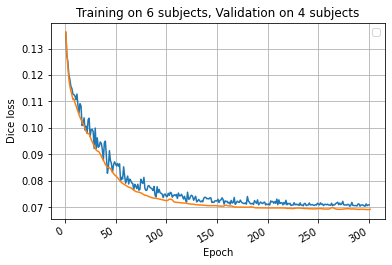

In [42]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Dice loss')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
ax.legend()
fig.autofmt_xdate()

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


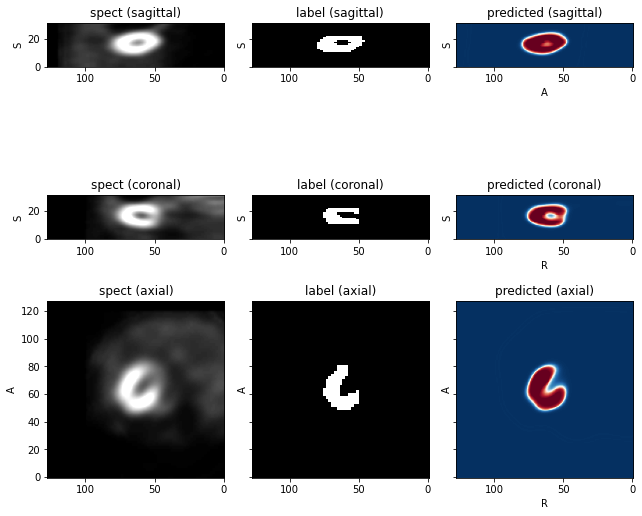

In [43]:
batch = next(iter(validation_loader))

model.eval()

inputs, targets = prepare_batch(batch, device)
FIRST = 1
FOREGROUND = 1

with torch.no_grad():

    probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()

affine = batch['spect'][tio.AFFINE][0].numpy()

subject = tio.Subject(
    spect=tio.ScalarImage(tensor=batch['spect'][tio.DATA][FIRST], affine=affine),
    label=tio.LabelMap(tensor=batch['left_ventricle'][tio.DATA][FIRST], affine=affine),
    predicted=tio.ScalarImage(tensor=probabilities[FIRST], affine=affine),
)
subject.plot(figsize=(9, 8), cmap_dict={'predicted': 'RdBu_r'})

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


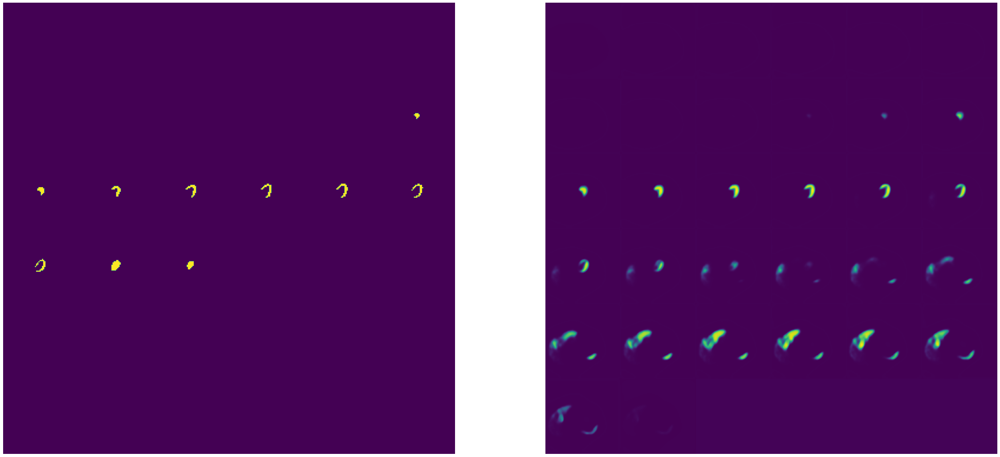

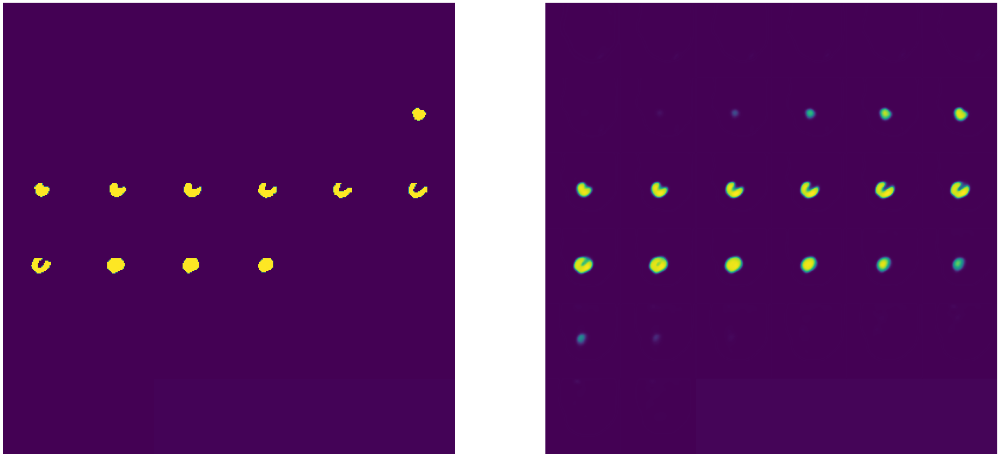

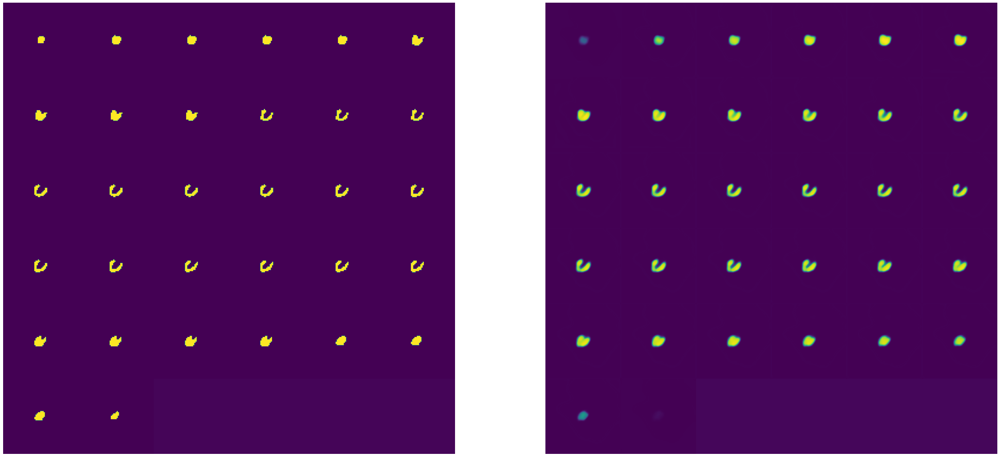

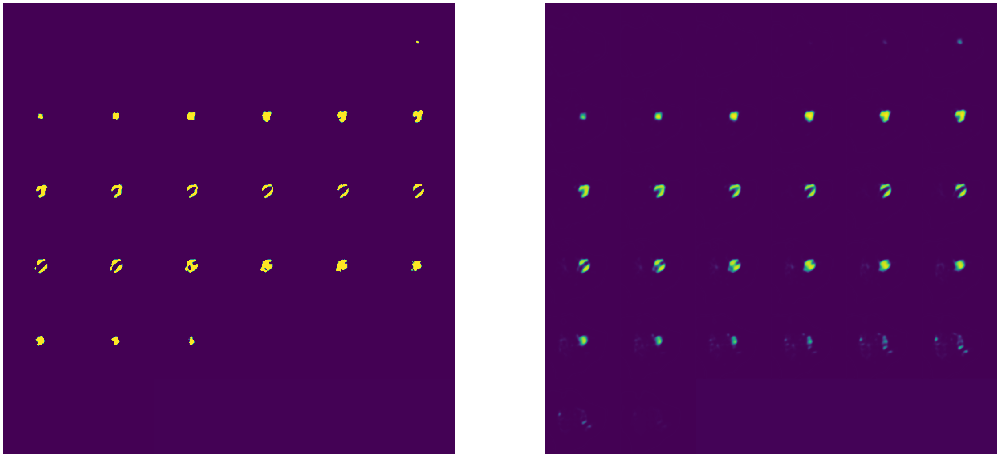

In [148]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        predictions = model(inputs).softmax(dim=1)
        probabilities = predictions[:, FOREGROUND:].cpu()
    
    for i in range(len(batch['spect'][tio.DATA])):
    
        spect = batch['spect'][tio.DATA][i].permute(3, 0, 1, 2)
        label = batch['left_ventricle'][tio.DATA][i][1:, ...].permute(3, 0, 1, 2)
        pred = probabilities[i].permute(3, 0, 1, 2)
        
        vis.visualize(
            np.squeeze(label.permute(1,0,2,3).numpy(), axis=0),
            np.squeeze(pred.permute(1,0,2,3).numpy(), axis=0)
        )

In [150]:
precision, recall, iou = compute_metrics(predictions, targets)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"IoU: {iou:.4f}")

Precision: 0.6954
Recall: 0.7940
IoU: 0.6009


## Log-Cosh Dice Loss

In [15]:
def run_epoch(epoch_idx, action, loader, model, optimizer):
    
    is_training = action == Action.TRAIN
    epoch_losses = []
    model.train(is_training)
    
    for batch_idx, batch in enumerate(tqdm(loader)):
        
        inputs, targets = prepare_batch(batch, device)
        optimizer.zero_grad()
    
        with torch.set_grad_enabled(is_training):
        
            logits = model(inputs)
            probabilities = F.softmax(logits, dim=CHANNELS_DIMENSION)
            
            batch_losses = torch.log(torch.cosh(get_dice_loss(probabilities, targets)))
            
            batch_loss = batch_losses.mean()
            
            if is_training:
            
                batch_loss.backward()
                optimizer.step()
            
            epoch_losses.append(batch_loss.item())
    
    epoch_losses = np.array(epoch_losses).mean()
    
    print(f'{action.value} mean loss: {epoch_losses.mean():0.3f}')
    
    return time.time(), epoch_losses


In [16]:
exp_name = 'instance_norm_dropout_logcosh'

num_epochs = 600

model, optimizer = get_model_and_optimizer(device)

weights_stem = 'whole_images'  # should be dropped ...

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, weights_stem)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


Validation mean loss: 0.237
Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.231


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.225
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.219


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.224
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.220


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.222
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.217


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.221
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.216


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.220
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.215


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.219
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.211


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.218
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.217
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.216
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.210


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.214
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.214


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.213
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.212
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.207


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.211
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.213


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.211
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.206


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.210
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.204


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.209
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.206


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.209
Starting epoch 18


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.204


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 19


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.207
Starting epoch 20


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.206
Starting epoch 21


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.205


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.205
Starting epoch 22


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.202


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.205
Starting epoch 23


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.196


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 24


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.209


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.204
Starting epoch 25


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 26


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.203


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.203
Starting epoch 27


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.190


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.202
Starting epoch 28


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.196


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.201
Starting epoch 29


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.198


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.201
Starting epoch 30


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.200
Starting epoch 31


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.199
Starting epoch 32


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.199
Starting epoch 33


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.193


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198
Starting epoch 34


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.197
Starting epoch 35


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.197
Starting epoch 36


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.192


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.196
Starting epoch 37


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.195


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 38


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.194


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.195
Starting epoch 39


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.186


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 40


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194
Starting epoch 41


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.186


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.193
Starting epoch 42


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.193


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.192
Starting epoch 43


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.189


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.192
Starting epoch 44


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.191
Starting epoch 45


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.184


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.190
Starting epoch 46


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.186


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 47


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.189
Starting epoch 48


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.175


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.188
Starting epoch 49


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.182


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 50


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.185


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.187
Starting epoch 51


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.184


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 52


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.177


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.186
Starting epoch 53


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.185
Starting epoch 54


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.187


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.184
Starting epoch 55


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.183
Starting epoch 56


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.178


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.183
Starting epoch 57


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.175


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.182
Starting epoch 58


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.175


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.181
Starting epoch 59


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.177


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.179
Starting epoch 60


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.176


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 61


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.188


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.178
Starting epoch 62


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 63


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.171


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.177
Starting epoch 64


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.176


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.176
Starting epoch 65


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.173


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.175
Starting epoch 66


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.158


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 67


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.164


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 68


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 69


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173
Starting epoch 70


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.172
Starting epoch 71


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.169


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.171
Starting epoch 72


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.169
Starting epoch 73


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.160


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 74


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.163


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.167
Starting epoch 75


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.163


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 76


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.168


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.166
Starting epoch 77


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.158


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.164
Starting epoch 78


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.169


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.163
Starting epoch 79


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.144


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.161
Starting epoch 80


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.157


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.157
Starting epoch 81


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.149


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.154
Starting epoch 82


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.152


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 83


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.172


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 84


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.169


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 85


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.173


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 86


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.151


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.153
Starting epoch 87


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.136


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.152
Starting epoch 88


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.147


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.149
Starting epoch 89


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.152


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.146
Starting epoch 90


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.179


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.143
Starting epoch 91


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.154


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142
Starting epoch 92


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.145


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.140
Starting epoch 93


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.138


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.138
Starting epoch 94


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.145


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.137
Starting epoch 95


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.131


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.136
Starting epoch 96


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.149


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.133
Starting epoch 97


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.135


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 98


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.130


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.126
Starting epoch 99


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.133


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.131
Starting epoch 100


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.132
Starting epoch 101


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.122


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.128
Starting epoch 102


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.155


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 103


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.125
Starting epoch 104


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.150


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129
Starting epoch 105


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.126


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.127
Starting epoch 106


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.134


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.123
Starting epoch 107


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.121


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.121
Starting epoch 108


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.117
Starting epoch 109


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.129


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115
Starting epoch 110


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.149


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115
Starting epoch 111


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.131


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.116
Starting epoch 112


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.123


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.114
Starting epoch 113


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.127


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.113
Starting epoch 114


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.127


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.111
Starting epoch 115


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.133


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.110
Starting epoch 116


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.145


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.108
Starting epoch 117


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.123


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.109
Starting epoch 118


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.131


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.106
Starting epoch 119


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.099
Starting epoch 120


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.115


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.092
Starting epoch 121


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 122


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.109


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.088
Starting epoch 123


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.122


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 124


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.119


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.093
Starting epoch 125


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.098
Starting epoch 126


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.114


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.100
Starting epoch 127


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.115


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.098
Starting epoch 128


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.096
Starting epoch 129


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 130


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.084
Starting epoch 131


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.162


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.082
Starting epoch 132


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.109


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.085
Starting epoch 133


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.114


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.086
Starting epoch 134


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.084
Starting epoch 135


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.114


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.084
Starting epoch 136


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.132


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 137


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.123


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.094
Starting epoch 138


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.127


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.097
Starting epoch 139


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.134


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.090
Starting epoch 140


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.102


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.091
Starting epoch 141


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.119


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.089
Starting epoch 142


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.089
Starting epoch 143


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.134


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.081
Starting epoch 144


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 145


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.121


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 146


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.108


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.088
Starting epoch 147


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.111


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.094
Starting epoch 148


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.111


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.095
Starting epoch 149


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.103


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.096
Starting epoch 150


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.124


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.095
Starting epoch 151


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.114


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.097
Starting epoch 152


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.099
Starting epoch 153


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.131


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.097
Starting epoch 154


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.092
Starting epoch 155


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.120


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.087
Starting epoch 156


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.083
Starting epoch 157


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.095


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 158


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 159


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 160


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.074
Starting epoch 161


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 162


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.064
Starting epoch 163


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.130


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.062
Starting epoch 164


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.096


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.063
Starting epoch 165


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 166


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 167


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.078
Starting epoch 168


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.091


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.075
Starting epoch 169


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 170


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.106


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 171


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.070
Starting epoch 172


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 173


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.071
Starting epoch 174


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.068
Starting epoch 175


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.115


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.065
Starting epoch 176


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.062
Starting epoch 177


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.066
Starting epoch 178


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.091


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.063
Starting epoch 179


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.062
Starting epoch 180


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.065
Starting epoch 181


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.072
Starting epoch 182


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 183


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.093


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.077
Starting epoch 184


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.076
Starting epoch 185


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.073
Starting epoch 186


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.105


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.069
Starting epoch 187


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.102


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.064
Starting epoch 188


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.061
Starting epoch 189


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.103


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 190


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.111


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.056
Starting epoch 191


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.057
Starting epoch 192


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.102


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.059
Starting epoch 193


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 194


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.052
Starting epoch 195


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.098


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 196


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.133


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.048
Starting epoch 197


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.093


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.053
Starting epoch 198


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.059
Starting epoch 199


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.063
Starting epoch 200


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.101


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.065
Starting epoch 201


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.093


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.063
Starting epoch 202


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.065
Starting epoch 203


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.063
Starting epoch 204


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.062
Starting epoch 205


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.062
Starting epoch 206


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.061
Starting epoch 207


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.095


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 208


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.055
Starting epoch 209


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.054
Starting epoch 210


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.055
Starting epoch 211


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.107


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 212


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 213


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.057
Starting epoch 214


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.054
Starting epoch 215


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 216


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.111


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.049
Starting epoch 217


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.090


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.051
Starting epoch 218


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.057
Starting epoch 219


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.059
Starting epoch 220


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.058
Starting epoch 221


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.054
Starting epoch 222


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.052
Starting epoch 223


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 224


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 225


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 226


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.090


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 227


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 228


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 229


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 230


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 231


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.052
Starting epoch 232


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.051
Starting epoch 233


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 234


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.048
Starting epoch 235


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.084


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.048
Starting epoch 236


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.100


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 237


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.048
Starting epoch 238


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 239


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 240


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 241


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.066


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 242


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 243


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.084


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 244


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.084


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.052
Starting epoch 245


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.052
Starting epoch 246


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.098


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.051
Starting epoch 247


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.049
Starting epoch 248


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.046
Starting epoch 249


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.090


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.044
Starting epoch 250


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.041
Starting epoch 251


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 252


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.084


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 253


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 254


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 255


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.038
Starting epoch 256


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 257


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 258


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 259


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.105


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.046
Starting epoch 260


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 261


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 262


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 263


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.106


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 264


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.041
Starting epoch 265


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 266


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.041
Starting epoch 267


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 268


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 269


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 270


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.036
Starting epoch 271


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035
Starting epoch 272


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 273


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 274


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.097


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 275


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.038
Starting epoch 276


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 277


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 278


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 279


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.105


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.038
Starting epoch 280


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 281


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 282


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 283


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 284


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 285


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 286


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.096


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.046
Starting epoch 287


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 288


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.051
Starting epoch 289


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.050
Starting epoch 290


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 291


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.046
Starting epoch 292


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.047
Starting epoch 293


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 294


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 295


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.095


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 296


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.041
Starting epoch 297


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.042
Starting epoch 298


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.104


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 299


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 300


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.039
Starting epoch 301


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.040
Starting epoch 302


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 303


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.088


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 304


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 305


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.094


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.041
Starting epoch 306


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 307


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.045
Starting epoch 308


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.043
Starting epoch 309


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.066


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.037
Starting epoch 310


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 311


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 312


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 313


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 314


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 315


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 316


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 317


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.036
Starting epoch 318


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.066


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.036
Starting epoch 319


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035
Starting epoch 320


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.118


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 321


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.031
Starting epoch 322


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 323


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.081


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 324


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 325


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 326


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.128


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 327


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 328


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 329


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 330


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.077


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 331


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 332


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 333


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.031
Starting epoch 334


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 335


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 336


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 337


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 338


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 339


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 340


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 341


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 342


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 343


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 344


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.078


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 345


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 346


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 347


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 348


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 349


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 350


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 351


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.090


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 352


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.031
Starting epoch 353


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.079


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 354


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 355


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 356


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 357


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 358


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.086


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 359


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 360


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 361


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 362


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 363


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.074


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 364


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 365


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 366


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 367


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 368


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 369


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.109


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 370


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.113


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 371


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 372


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 373


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 374


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 375


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 376


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.084


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 377


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 378


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 379


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 380


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 381


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035
Starting epoch 382


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 383


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.032
Starting epoch 384


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 385


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 386


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 387


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 388


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.087


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 389


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 390


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 391


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.090


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 392


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.031
Starting epoch 393


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 394


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 395


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 396


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 397


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 398


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 399


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 400


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.031
Starting epoch 401


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.034
Starting epoch 402


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035
Starting epoch 403


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.036
Starting epoch 404


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035
Starting epoch 405


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.033
Starting epoch 406


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 407


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 408


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 409


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 410


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 411


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 412


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 413


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.042


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 414


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.092


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 415


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.042


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 416


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 417


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 418


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 419


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 420


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 421


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 422


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 423


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 424


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 425


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 426


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 427


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 428


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 429


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 430


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 431


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 432


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 433


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.085


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 434


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 435


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 436


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.067


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 437


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 438


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 439


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.066


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 440


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 441


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 442


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 443


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 444


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 445


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.063


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 446


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 447


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.072


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 448


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.040


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 449


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.035


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.017
Starting epoch 450


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.016
Starting epoch 451


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.017
Starting epoch 452


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.080


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 453


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 454


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 455


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 456


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.043


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 457


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 458


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 459


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 460


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 461


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 462


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 463


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 464


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 465


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 466


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 467


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 468


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 469


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.030
Starting epoch 470


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.069


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 471


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 472


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 473


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 474


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.099


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 475


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 476


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 477


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 478


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 479


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 480


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.070


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 481


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 482


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.076


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 483


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 484


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 485


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 486


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 487


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 488


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 489


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 490


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 491


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 492


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 493


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 494


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.043


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 495


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 496


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 497


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.059


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 498


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 499


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.089


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 500


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.040


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 501


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 502


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 503


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 504


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.036


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 505


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 506


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 507


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 508


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 509


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 510


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.055


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 511


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 512


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 513


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.040


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 514


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 515


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 516


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 517


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 518


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 519


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 520


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 521


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.036


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 522


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.075


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 523


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 524


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 525


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.058


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 526


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 527


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 528


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.073


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 529


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.045


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 530


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.083


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 531


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 532


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 533


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.043


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 534


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.040


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 535


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.068


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 536


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 537


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 538


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.036


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 539


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.071


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 540


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.066


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 541


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.048


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 542


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 543


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 544


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.048


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 545


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.064


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 546


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 547


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 548


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 549


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.039


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 550


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.057


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 551


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.048


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 552


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 553


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 554


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 555


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.042


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 556


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 557


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.091


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 558


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.048


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 559


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.045


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 560


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.030


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 561


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.054


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 562


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.017
Starting epoch 563


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.017
Starting epoch 564


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.040


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.018
Starting epoch 565


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.045


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.019
Starting epoch 566


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 567


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.036


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 568


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.039


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 569


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 570


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.060


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 571


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.043


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 572


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.082


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 573


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 574


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 575


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.043


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 576


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.062


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 577


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.049


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026
Starting epoch 578


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 579


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.024
Starting epoch 580


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.039


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 581


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.046


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 582


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.053


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 583


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 584


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.051


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 585


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 586


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 587


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.056


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 588


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.041


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.020
Starting epoch 589


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.048


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.021
Starting epoch 590


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.052


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 591


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.038


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.022
Starting epoch 592


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.044


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.023
Starting epoch 593


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.065


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.025
Starting epoch 594


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 595


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 596


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.050


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 597


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.061


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.029
Starting epoch 598


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.047


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.028
Starting epoch 599


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.038


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.027
Starting epoch 600


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.037


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.026


NameError: name 'path_saved_models' is not defined

No handles with labels found to put in legend.


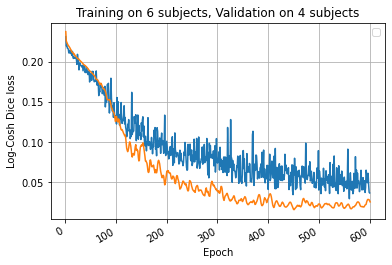

In [19]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Log-Cosh Dice loss')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
ax.legend()
fig.autofmt_xdate()

C:\Users\hkris\anaconda3\envs\SkyTorch\lib\site-packages\unet\decoding.py:146: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  half_crop = crop // 2


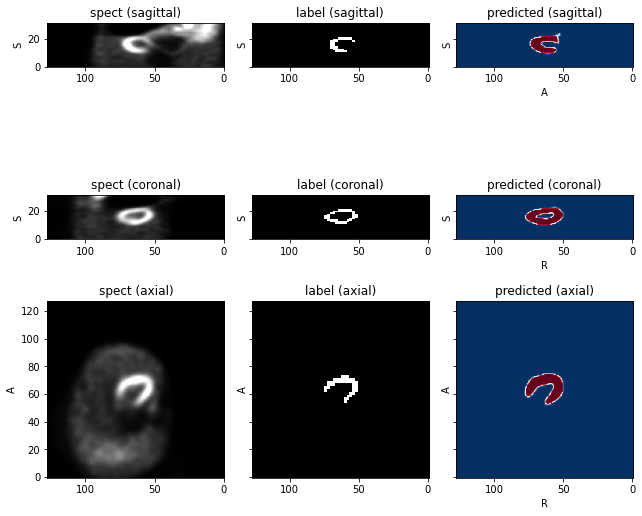

In [20]:
batch = next(iter(validation_loader))

model.eval()

inputs, targets = prepare_batch(batch, device)
FIRST = 1
FOREGROUND = 1

with torch.no_grad():

    probabilities = model(inputs).softmax(dim=1)[:, FOREGROUND:].cpu()

affine = batch['spect'][tio.AFFINE][0].numpy()

subject = tio.Subject(
    spect=tio.ScalarImage(tensor=batch['spect'][tio.DATA][FIRST], affine=affine),
    label=tio.LabelMap(tensor=batch['left_ventricle'][tio.DATA][FIRST], affine=affine),
    predicted=tio.ScalarImage(tensor=probabilities[FIRST], affine=affine),
)
subject.plot(figsize=(9, 8), cmap_dict={'predicted': 'RdBu_r'})

  0%|          | 0/1 [00:00<?, ?it/s]

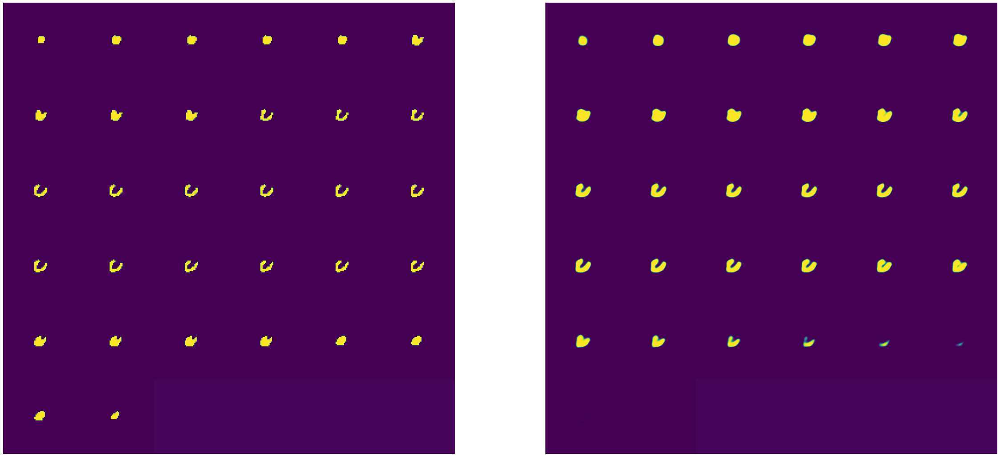

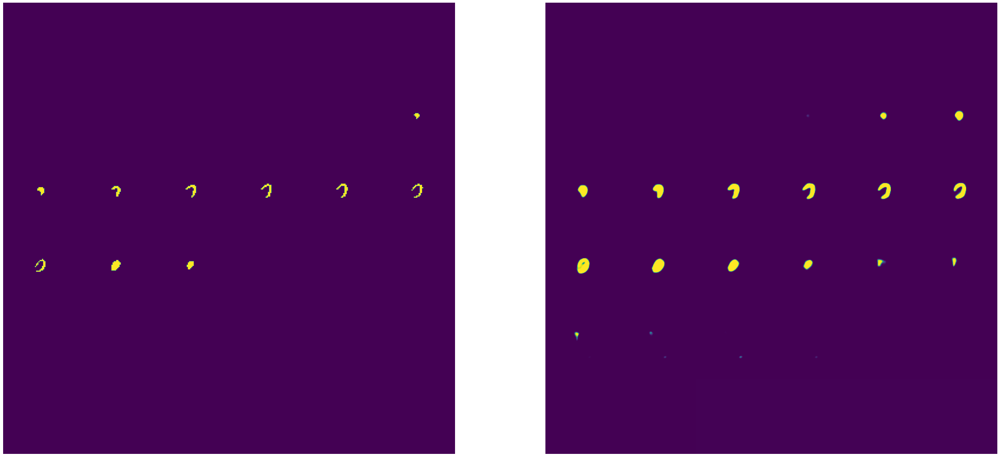

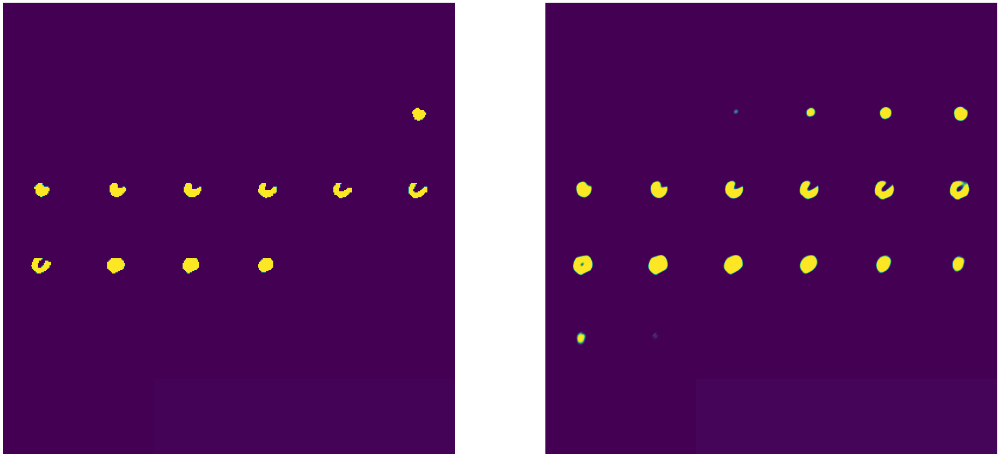

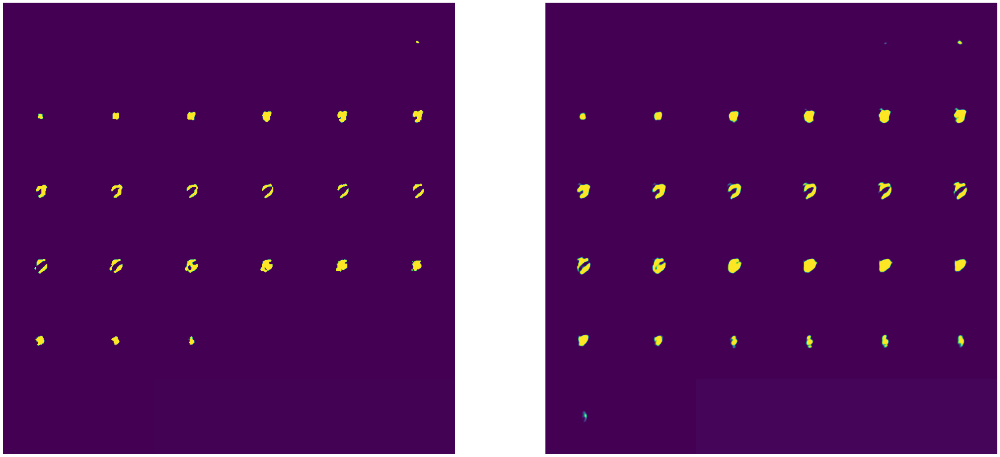

In [21]:
model.eval()

for batch_idx, batch in enumerate(tqdm(validation_loader)):

    inputs, targets = prepare_batch(batch, device)
    
    with torch.no_grad():

        predictions = model(inputs).softmax(dim=1)
        probabilities = predictions[:, FOREGROUND:].cpu()
    
    for i in range(len(batch['spect'][tio.DATA])):
    
        spect = batch['spect'][tio.DATA][i].permute(3, 0, 1, 2)
        label = batch['left_ventricle'][tio.DATA][i][1:, ...].permute(3, 0, 1, 2)
        pred = probabilities[i].permute(3, 0, 1, 2)
        
        vis.visualize(
            np.squeeze(label.permute(1,0,2,3).numpy(), axis=0),
            np.squeeze(pred.permute(1,0,2,3).numpy(), axis=0)
        )

In [24]:
precision, recall, iou = compute_metrics(predictions, targets)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"IoU: {iou:.4f}")

Precision: 0.5452
Recall: 0.9590
IoU: 0.5300


## Implement logging to tensorboward or wandb, callbacks - early stopping,
## best model saving, learning rate scheduler

In [161]:
for name, param in model.named_parameters():
    print('name: ', name)
    print(type(param))
    print('param.shape: ', param.shape)
    print('param.requires_grad: ', param.requires_grad)
    print('=====')

name:  encoder.encoding_blocks.0.conv1.conv_layer.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([8, 1, 3, 3, 3])
param.requires_grad:  True
=====
name:  encoder.encoding_blocks.0.conv1.conv_layer.bias
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([8])
param.requires_grad:  True
=====
name:  encoder.encoding_blocks.0.conv1.activation_layer.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([1])
param.requires_grad:  True
=====
name:  encoder.encoding_blocks.0.conv2.conv_layer.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([16, 8, 3, 3, 3])
param.requires_grad:  True
=====
name:  encoder.encoding_blocks.0.conv2.activation_layer.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([1])
param.requires_grad:  True
=====
name:  encoder.encoding_blocks.1.conv1.conv_layer.weight
<class 'torch.nn.parameter.Parameter'>
param.shape:  torch.Size([16, 16, 3, 3, 3])
param.requires_grad:  True
===

In [163]:
print(model.state_dict())

OrderedDict([('encoder.encoding_blocks.0.conv1.conv_layer.weight', tensor([[[[[ 0.1662,  0.0025, -0.1078],
           [-0.1444, -0.0398, -0.0974],
           [-0.0016,  0.0235, -0.0695]],

          [[-0.1258,  0.0365,  0.0794],
           [ 0.0318,  0.0291, -0.0312],
           [ 0.0339,  0.1172,  0.0253]],

          [[-0.1291,  0.0440,  0.1633],
           [-0.1515, -0.1616, -0.0223],
           [ 0.1125, -0.0418,  0.0081]]]],



        [[[[-0.1163, -0.0947, -0.1178],
           [-0.1457,  0.1284,  0.0330],
           [ 0.1332, -0.0027, -0.1124]],

          [[-0.1202, -0.1653,  0.2281],
           [-0.1562,  0.2065,  0.1663],
           [-0.0723, -0.0126,  0.0043]],

          [[-0.1333, -0.0496,  0.3044],
           [ 0.0227,  0.0833,  0.1340],
           [ 0.0498,  0.1280,  0.3501]]]],



        [[[[ 0.0523,  0.0144,  0.0511],
           [ 0.0284,  0.1777,  0.1300],
           [-0.2266, -0.0270,  0.1173]],

          [[-0.1173,  0.0294,  0.1010],
           [-0.1564,  0.2069,  

In [28]:
summary(model)

Layer (type:depth-idx)                                  Param #
UNet                                                    --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          3,682
│    │    └─EncodingBlock: 3-2                          20,738
├─EncodingBlock: 1-2                                    --
│    └─ConvolutionalBlock: 2-2                          --
│    │    └─Conv3d: 3-3                                 27,648
│    │    └─InstanceNorm3d: 3-4                         --
│    │    └─PReLU: 3-5                                  1
│    │    └─Dropout3d: 3-6                              --
│    │    └─Sequential: 3-7                             27,649
│    └─ConvolutionalBlock: 2-3                          --
│    │    └─Conv3d: 3-8                                 55,296
│    │    └─InstanceNorm3d: 3-9                         --
│    │    └─PReLU: 3-10          

In [22]:
def run_epoch(epoch_idx, action, loader, model, optimizer, scheduler):
    
    is_training = action == Action.TRAIN
    epoch_losses = []
    precisions, recalls, ious = [], [], []
    model.train(is_training)
    
    for batch_idx, batch in enumerate(tqdm(loader)):
        
        inputs, targets = prepare_batch(batch, device)
        optimizer.zero_grad()
    
        with torch.set_grad_enabled(is_training):
        
            logits = model(inputs)
            probabilities = F.softmax(logits, dim=CHANNELS_DIMENSION)
            batch_losses = get_dice_loss(probabilities, targets)
            batch_loss = batch_losses.mean()
            
            if is_training:
            
                batch_loss.backward()
                optimizer.step()
            
            epoch_losses.append(batch_loss.item())
            
            prec, rec, iou = compute_metrics(probabilities, targets)
            precisions.append(prec)
            recalls.append(rec)
            ious.append(iou)
    
    scheduler.step()
    epoch_losses = np.array(epoch_losses).mean()
    
    print(
        f'{action.value} mean loss: {epoch_losses.mean():0.3f}'
        f'\tPrecision: {np.array(precisions).mean():.2f}'
        f'\tRecall: {np.array(recalls).mean():.2f}\tIoU: {np.array(ious).mean():.2f}'
    )
    
    return time.time(), epoch_losses


def train(num_epochs, training_loader, validation_loader, model, optimizer, scheduler):
    
    train_losses = []
    val_losses = []
    
    for epoch_idx in range(1, num_epochs + 1):
    
        print('Starting epoch', epoch_idx)
        train_losses.append(run_epoch(epoch_idx, Action.TRAIN, training_loader, model, optimizer, scheduler))
        val_losses.append(run_epoch(epoch_idx, Action.VALIDATE, validation_loader, model, optimizer, scheduler))
    
    return np.array(train_losses), np.array(val_losses)

In [23]:
training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape, mask_name="left_ventricle"),
    tio.ZNormalization(),
    tio.OneHot()
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape, mask_name="left_ventricle"),
    tio.ZNormalization(),
    tio.OneHot()
])

In [24]:
training_split_ratio = 0.6

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 6 subjects
Validation set: 4 subjects


In [25]:
training_batch_size = 2
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

In [26]:
num_epochs = 500
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.99)
learning_rates = []

for i in range(num_epochs):
    learning_rates.append(scheduler.get_last_lr())
    scheduler.step()
    
    
fig = plt.figure(figsize=(10, 4))
plt.plot(list(range(1, num_epochs + 1)), learning_rates)
plt.xlabel('Epoch')
plt.ylabel('Learning rate')

NameError: name 'model' is not defined

In [16]:
exp_name = 'relative_patch_instance_norm_aug'

checkpoint = torch.load(os.path.join(path_saved_models, f'{exp_name}.pth'))

encoder_weights = {k.replace('encoder.', ''): v for k, v in checkpoint['weights'].items() if k.startswith('encoder')}

num_epochs = 500

model = UNet(
    in_channels=1,
    out_classes=2,
    dimensions=3,
    num_encoding_blocks=3,
    out_channels_first_layer=8,
    normalization='instance',
    upsampling_type='linear',
    padding=True,
    activation='PReLU',
    dropout=0.0
).to(device)

model.encoder.load_state_dict(encoder_weights)


for name, param in model.named_parameters():
    
    if name.startswith('encoder'):
        param.requires_grad = False
    else:
        param.requires_grad = True

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.99)
        
"""
for name, param in model.named_parameters():
    
    if name.startswith('encoder') and 'blocks.1.' not in name:
        param.requires_grad = False
    else:
        param.requires_grad = True
"""
    
exp_name = 'ssl_pretrain_supervised'    

weights_stem = 'whole_images'
train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, scheduler)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

NameError: name 'device' is not defined

In [107]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 10

downsampling_factor = 3
original_spacing = 1
target_spacing = downsampling_factor / original_spacing  # in mm

patch_dim = 28
gap = 14


training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.ZNormalization(),
    tio.RandomFlip(axes=(0, 1, 2), p=0.5),
    tio.OneOf({
        tio.RandomAnisotropy(): 0.5,
        tio.RandomBlur(): 0.5,
        tio.RandomNoise(): 0.5,  
    }, p=0.5),
    tio.OneOf({
        tio.RandomAffine(): 0.5,
        tio.RandomElasticDeformation(max_displacement=max_displacement): 0.5,
        tio.RandomElasticDeformation(
            max_displacement=max_displacement,
            num_control_points=num_control_points
        ): 0.5,
        tio.RandomMotion(num_transforms=4, image_interpolation='linear'): 0.5
    }, p=0.8),
    tio.OneHot()
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.ZNormalization(),
    tio.OneHot()
])

In [108]:
training_split_ratio = 0.6

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 6 subjects
Validation set: 4 subjects


In [109]:
training_batch_size = 2
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

In [110]:
exp_name = 'relative_patch_instance_norm_aug_dropout'

checkpoint = torch.load(os.path.join(path_saved_models, f'{exp_name}.pth'))

encoder_weights = {k.replace('encoder.', ''): v for k, v in checkpoint['weights'].items() if k.startswith('encoder')}

num_epochs = 500

model = UNet(
    in_channels=1,
    out_classes=2,
    dimensions=3,
    num_encoding_blocks=3,
    out_channels_first_layer=8,
    normalization='instance',
    upsampling_type='linear',
    padding=True,
    activation='PReLU',
    dropout=0.3
).to(device)

model.encoder.load_state_dict(encoder_weights)

for name, param in model.named_parameters():
    
    if name.startswith('encoder'):
        param.requires_grad = False
    else:
        param.requires_grad = True

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

exp_name = 'ssl_pretrain_supervised'    

weights_stem = 'whole_images'
train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, optimizer, scheduler)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.625	Precision: 0.05	Recall: 0.52	IoU: 0.05


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.604	Precision: 0.05	Recall: 1.00	IoU: 0.05
Starting epoch 2


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.595	Precision: 0.10	Recall: 0.96	IoU: 0.10


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.597	Precision: 0.04	Recall: 1.00	IoU: 0.04
Starting epoch 3


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.584	Precision: 0.11	Recall: 0.98	IoU: 0.11


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.593	Precision: 0.05	Recall: 1.00	IoU: 0.05
Starting epoch 4


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.585	Precision: 0.07	Recall: 0.89	IoU: 0.07


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.590	Precision: 0.05	Recall: 1.00	IoU: 0.05
Starting epoch 5


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.583	Precision: 0.17	Recall: 0.99	IoU: 0.17


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.586	Precision: 0.06	Recall: 1.00	IoU: 0.06
Starting epoch 6


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.572	Precision: 0.14	Recall: 1.00	IoU: 0.14


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.583	Precision: 0.05	Recall: 1.00	IoU: 0.05
Starting epoch 7


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.566	Precision: 0.17	Recall: 1.00	IoU: 0.17


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.581	Precision: 0.05	Recall: 1.00	IoU: 0.05
Starting epoch 8


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.568	Precision: 0.17	Recall: 1.00	IoU: 0.17


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.578	Precision: 0.06	Recall: 1.00	IoU: 0.06
Starting epoch 9


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.557	Precision: 0.16	Recall: 0.98	IoU: 0.16


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.574	Precision: 0.06	Recall: 1.00	IoU: 0.06
Starting epoch 10


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.568	Precision: 0.17	Recall: 1.00	IoU: 0.17


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.571	Precision: 0.07	Recall: 1.00	IoU: 0.07
Starting epoch 11


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.556	Precision: 0.18	Recall: 0.93	IoU: 0.18


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.568	Precision: 0.07	Recall: 1.00	IoU: 0.07
Starting epoch 12


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.560	Precision: 0.12	Recall: 1.00	IoU: 0.12


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.565	Precision: 0.08	Recall: 0.99	IoU: 0.08
Starting epoch 13


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.551	Precision: 0.23	Recall: 0.97	IoU: 0.22


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.561	Precision: 0.09	Recall: 0.99	IoU: 0.09
Starting epoch 14


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.547	Precision: 0.23	Recall: 0.99	IoU: 0.23


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.559	Precision: 0.08	Recall: 0.99	IoU: 0.08
Starting epoch 15


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.539	Precision: 0.23	Recall: 0.91	IoU: 0.19


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.558	Precision: 0.07	Recall: 1.00	IoU: 0.07
Starting epoch 16


  0%|          | 0/3 [00:00<?, ?it/s]

Training mean loss: 0.539	Precision: 0.19	Recall: 1.00	IoU: 0.19


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.556	Precision: 0.07	Recall: 1.00	IoU: 0.07
Starting epoch 17


  0%|          | 0/3 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [92]:
for name, param in model.named_parameters():
    print(f'Name: {name}\t requires_grad: {param.requires_grad}')

Name: encoder.encoding_blocks.0.conv1.conv_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.0.conv1.conv_layer.bias	 requires_grad: True
Name: encoder.encoding_blocks.0.conv1.activation_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.0.conv2.conv_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.0.conv2.activation_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.1.conv1.conv_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.1.conv1.activation_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.1.conv2.conv_layer.weight	 requires_grad: True
Name: encoder.encoding_blocks.1.conv2.activation_layer.weight	 requires_grad: True
Name: bottom_block.conv1.conv_layer.weight	 requires_grad: True
Name: bottom_block.conv1.activation_layer.weight	 requires_grad: True
Name: bottom_block.conv2.conv_layer.weight	 requires_grad: True
Name: bottom_block.conv2.activation_layer.weight	 requires_grad: True
Name: decoder.dec

In [61]:
for k, v in model.state_dict().items():
    print(k)

encoder.encoding_blocks.0.conv1.conv_layer.weight
encoder.encoding_blocks.0.conv1.conv_layer.bias
encoder.encoding_blocks.0.conv1.activation_layer.weight
encoder.encoding_blocks.0.conv1.block.0.weight
encoder.encoding_blocks.0.conv1.block.0.bias
encoder.encoding_blocks.0.conv1.block.1.weight
encoder.encoding_blocks.0.conv2.conv_layer.weight
encoder.encoding_blocks.0.conv2.activation_layer.weight
encoder.encoding_blocks.0.conv2.block.0.weight
encoder.encoding_blocks.0.conv2.block.2.weight
encoder.encoding_blocks.1.conv1.conv_layer.weight
encoder.encoding_blocks.1.conv1.activation_layer.weight
encoder.encoding_blocks.1.conv1.block.0.weight
encoder.encoding_blocks.1.conv1.block.2.weight
encoder.encoding_blocks.1.conv2.conv_layer.weight
encoder.encoding_blocks.1.conv2.activation_layer.weight
encoder.encoding_blocks.1.conv2.block.0.weight
encoder.encoding_blocks.1.conv2.block.2.weight
bottom_block.conv1.conv_layer.weight
bottom_block.conv1.activation_layer.weight
bottom_block.conv1.block.0.

In [62]:
summary(model)

Layer (type:depth-idx)                                  Param #
UNet                                                    --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          (3,682)
│    │    └─EncodingBlock: 3-2                          20,738
├─EncodingBlock: 1-2                                    --
│    └─ConvolutionalBlock: 2-2                          --
│    │    └─Conv3d: 3-3                                 27,648
│    │    └─InstanceNorm3d: 3-4                         --
│    │    └─PReLU: 3-5                                  1
│    │    └─Dropout3d: 3-6                              --
│    │    └─Sequential: 3-7                             27,649
│    └─ConvolutionalBlock: 2-3                          --
│    │    └─Conv3d: 3-8                                 55,296
│    │    └─InstanceNorm3d: 3-9                         --
│    │    └─PReLU: 3-10        

In [68]:
model

UNet(
  (encoder): Encoder(
    (encoding_blocks): ModuleList(
      (0): EncodingBlock(
        (conv1): ConvolutionalBlock(
          (conv_layer): Conv3d(1, 8, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (activation_layer): PReLU(num_parameters=1)
          (dropout_layer): Dropout3d(p=0.3, inplace=False)
          (block): Sequential(
            (0): Conv3d(1, 8, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
            (1): PReLU(num_parameters=1)
            (2): Dropout3d(p=0.3, inplace=False)
          )
        )
        (conv2): ConvolutionalBlock(
          (conv_layer): Conv3d(8, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (norm_layer): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (activation_layer): PReLU(num_parameters=1)
          (dropout_layer): Dropout3d(p=0.3, inplace=False)
          (block): Sequential(
            (0): Conv3d(8, 16, 

In [112]:
def replace_target_norm_layer_for_group_norm(model, target, desired, num_groups=8):
    for child_name, child in model.named_children():
        if isinstance(child, target):
            print(child.num_features)
            setattr(model, child_name, desired(num_groups=num_groups, num_channels=child.num_features))
        else:
            replace_target_norm_layer_for_group_norm(child, target, desired, name + f'{child_name}.')

In [114]:
replace_target_norm_layer_for_group_norm(model, nn.InstanceNorm3d, nn.GroupNorm)

16
16
16
16
32
32
32
32
64
64
32
32
32
32
16
16
16
16


In [115]:
summary(model)

Layer (type:depth-idx)                             Param #
UNet                                               --
├─Encoder: 1-1                                     --
│    └─ModuleList: 2-1                             --
│    │    └─EncodingBlock: 3-1                     3,746
│    │    └─EncodingBlock: 3-2                     20,930
├─EncodingBlock: 1-2                               --
│    └─ConvolutionalBlock: 2-2                     --
│    │    └─Conv3d: 3-3                            27,648
│    │    └─GroupNorm: 3-4                         64
│    │    └─PReLU: 3-5                             1
│    │    └─Dropout3d: 3-6                         --
│    │    └─Sequential: 3-7                        27,713
│    └─ConvolutionalBlock: 2-3                     --
│    │    └─Conv3d: 3-8                            55,296
│    │    └─GroupNorm: 3-9                         128
│    │    └─PReLU: 3-10                            1
│    │    └─Dropout3d: 3-11                        --
│    

In [ ]:
nn.GroupNorm()